In [0]:
from pyspark.sql.types import *
import pyspark
from pyspark.sql import SparkSession
import os
from pyspark.sql.functions import col, size, expr, lower, array_distinct, filter, transform, when, countDistinct, avg, explode 
%pip install fuzzywuzzy

spark.sparkContext.setLogLevel("ERROR")
spark = SparkSession.builder.getOrCreate()


companies = spark.read.parquet('/dbfs/linkedin_train_data')
profiles = spark.read.parquet('/dbfs/linkedin_people_train_data')

  Obtaining dependency information for fuzzywuzzy from https://files.pythonhosted.org/packages/43/ff/74f23998ad2f93b945c0309f825be92e04e0348e062026998b5eefef4c33/fuzzywuzzy-0.18.0-py2.py3-none-any.whl.metadata
Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
# ### Amazon demo ###
# employee_id = "thuypham03"
# filtered_employee_1 = profiles.filter(col("id") == employee_id)
# company_name_1 = "amazon"
# position_1 = "software engineer"
# experience_1 = 4
# edu_score_1 = 45
# degree_level_1 = "bachelor"
# degree_type_1 = "Computer Science"
# field_1 = "Engineering"
# rank_1 = "mid"

### Meta demo ###
employee_id = "baocheng-virgil-wei"
filtered_employee_1 = profiles.filter(col("id") == employee_id)
company_name_1 = "meta"
position_1 = "Data Scientist"
experience_1 = 88
edu_score_1 = 156
degree_level_1 = "master's"
degree_type_1 = "Data Science"
field_1 = "Data"
rank_1 = "executive"

# ### Microsoft demo ###
# employee_id = "bsteinig"
# filtered_employee_1 = profiles.filter(col("id") == "bsteinig")
# company_name_1 = "microsoft"
# position_1 = "software engineer"
# experience_1 = 98
# edu_score_1 = 45
# degree_level_1 = "bachelor"
# degree_type_1 = "Computer Science"
# field_1 = "engineering"
# rank_1 = "senior"


In [0]:
%python
from pyspark.sql.functions import col, expr

def get_employee_profile_links(company_name):
    # Filter profiles for current or past employees of the given company
    filtered_profiles = profiles.filter(
        (lower(col("current_company.name")) == company_name_1)
        # (expr(f"array_contains(transform(experience, x -> lower(x.company)), lower('{company_name}'))"))
    )
    
    # Select profile links
    profile_links = filtered_profiles.select("url", "education", "educations_details", "certifications", "experience", "сourses", "current_company", "id")
    
    return profile_links

# Example usage
employee_profile_links_df = get_employee_profile_links(company_name_1)
display(employee_profile_links_df)

url education educations_details certifications experience сourses current_company id https://www.linkedin.com/in/jay-burgess-57b5342 List(List(Accounting, 2005, null, 2000 - 2005, 2000, Brigham Young University, https://www.linkedin.com/school/brigham-young-university/?trk=public_profile_school_profile-section-card_image-click)) Brigham Young University List(List(Credential ID 117194, California Board of Accountancy, Certified Public Accountant)) List(List(null, null, null, Aug 2017 - Present 6 years 2 months, 6 years 2 months, Present, Denver, Colorado, United States, null, Aug 2017, Meta, https://www.linkedin.com/company/meta?trk=public_profile_experience-item_profile-section-card_subtitle-click, Director, Accounting Controllership (Content, Music, e-Commerce & Payments), null), List(null, null, null, Jul 2014 Aug 2017 3 years 2 months, 3 years 2 months, Aug 2017, Santa Clara, CA, null, Jul 2014, DataStax, https://www.linkedin.com/company/datastax?trk=public_profile_experience-item_profile-section-card_subtitle-click, Assistant Controller, null), List(null, null, null, Dec 2013 Jun 2014 7 months, 7 months, Jun 2014, Mountain View, CA, null, Dec 2013, Google, https://www.linkedin.com/company/google?trk=public_profile_experience-item_profile-section-card_subtitle-click, Hardware Revenue Accounting Lead, null), List(null, null, Lead and manage engagement teams responsible for financial statement and internal control audits for public and private Silicon Valley companies. Audits for high-tech and biotech companies include: • Facebook (including IPO) • Nektar Therapeutics • Portola Pharmaceuticals Oversee multiple teams working simultaneously on various client projects. Prepare financial statements and disclosures for privately-held companies. Review SEC filings for public clients, ensuring compliance with U.S generally accepted accounting principles. Show less, Sep 2005 Dec 2013 8 years 4 months, 8 years 4 months, Dec 2013, Palo Alto, CA, null, Sep 2005, Ernst & Young, https://www.linkedin.com/company/ernstandyoung?trk=public_profile_experience-item_profile-section-card_subtitle-click, Senior Manager - Assurance, null), List(null, null, null, Jun 2004 Jan 2005 8 months, 8 months, Jan 2005, Somers, NY, null, Jun 2004, IBM, https://www.linkedin.com/company/ibm?trk=public_profile_experience-item_profile-section-card_subtitle-click, Strategic Outsourcing Intern, null)) List() List(meta, Meta, https://www.linkedin.com/company/meta?trk=public_profile_topcard-current-company, Meta, Director, Accounting Controllership @Meta (f.k.a Facebook)) jay-burgess-57b5342 https://www.linkedin.com/in/chrissy-kane-13b6a84 List(List(Bachelor of Arts (BA), 2005, Sociology, 2001 - 2005 Graduated, 2001, San Jose State University, https://fi.linkedin.com/school/san-jose-state-university/?trk=public_profile_school_profile-section-card_image-click)) null List() List(List(null, null, Currently supporting infrastructure, product, design, and business using my versatile technical recruiting skills Proven skills in project management, diversity and inclusion, technical recruiting, management, leadership, and candidate screening. Led a team of 5 sourcing professionals to achieve 100% of hiring goals in 2022 Managed a team of recruiting individual contributors on qualitative projects, leveraging their strengths and skills to drive impactful experiences. Collaborated with the recruiting function at Meta's 2022 Black Product Managers (BPM) event, partnering with stakeholders to inform ongoing program and project decisions that shaped our recruiting strategy roadmap. Provided thorough feedback in mid cycle performance reviews to each team member to promote individual growth. Successfully promoted two team members within a year of starting as their manager, while meeting Meta's rigorous promotion process and rubric of expectations. Show less, Feb 2022 - Present 1 year 8 months, 1 year 8 months, Present, San Francisco Bay Area, null, Feb 2022, Meta, https://fi.linke

### Feature 1 - Courses and Certifications ###

#### Industry wide courses and certifications ####

In [0]:
from fuzzywuzzy import fuzz
from pyspark.sql.functions import udf, col
from pyspark.sql.types import BooleanType

# Define a Python function for fuzzy matching
def is_similar_to_software_engineer(position):
    if position is None:
        return False
    # Compute a similarity ratio between the position and "software engineer"
    similarity_ratio = fuzz.token_set_ratio(position.lower(), position_1)
    # Define a threshold to consider as a match (e.g., 80 out of 100)
    return similarity_ratio >= 80

# Convert the Python function to a PySpark UDF
similarity_udf = udf(is_similar_to_software_engineer, BooleanType())

# Filter the DataFrame using the UDF on the "position" column
filtered_position_courses_profiles = profiles.filter(similarity_udf(col("position")))
filtered_position_certifications_profiles = profiles.filter(similarity_udf(col("position")))

filtered_position_courses_profiles = filtered_position_courses_profiles.filter(size(col("сourses")) > 0)
filtered_position_certifications_profiles = filtered_position_certifications_profiles.filter(size(col("certifications")) > 0)


/local_disk0/.ephemeral_nfs/envs/pythonEnv-da5e0820-2c20-43e4-b9bf-c675d2b588e7/lib/python3.11/site-packages/fuzzywuzzy/fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


In [0]:
from pyspark.sql.functions import explode, col

def merge_similar_courses(items, threshold=90):
    """
    Merge items with similar names based on a similarity threshold.
    Each group will accumulate a total count and list all similar titles.
    """
    merged = []  # List to store merged item groups
    
    for title, count in items:
        found_group = False
        
        # Attempt to merge this title into an existing group
        for group in merged:
            rep_title = group['title']
            # If the current title is similar enough to the group's representative title
            if fuzz.token_set_ratio(title.lower(), rep_title.lower()) >= threshold:
                group['count'] += count
                group['titles'].append(title)
                found_group = True
                break
        
        # If no similar group was found, create a new group
        if not found_group:
            merged.append({
                'title': title,     # representative title for the group
                'count': count,     # aggregated count
                'titles': [title]   # list of titles merged into this group
            })
    
    return merged

def process_and_merge(df, array_column, threshold=90):
    """
    Explodes the specified array column from df, groups by the nested title, 
    counts occurrences, and then merges similar titles.
    Returns merged groups.
    """
    # Explode the array column into individual rows
    exploded_df = df.withColumn("item", explode(col(array_column)))
    
    # Group by title within the exploded items, count occurrences, and order by count descending
    common_items = (
        exploded_df.groupBy(col("item.title").alias("item_title"))
                   .count()
                   .orderBy(col("count").desc())
    )
    
    # Collect the titles and counts to the driver
    items_list = [(row['item_title'], row['count']) for row in common_items.collect()]
    
    # Merge similar titles
    merged_items = merge_similar_courses(items_list, threshold=threshold)
    
    return merged_items

# Process and merge similar course titles for courses profiles DataFrame
merged_courses = process_and_merge(filtered_position_courses_profiles, "сourses", threshold=90)

# Process and merge similar certification titles for certifications profiles DataFrame
merged_certifications = process_and_merge(filtered_position_certifications_profiles, "certifications", threshold=90)


In [0]:
print("Merged Courses:")
for group in merged_courses[:10]:
    print(f"Representative Title: {group['title']}")
    print(f"Total Count: {group['count']}")
    print(f"Merged Titles: {group['titles']}")
    print("-" * 40)

print("\nMerged Certifications:")
for group in merged_certifications[:10]:
    print(f"Representative Title: {group['title']}")
    print(f"Total Count: {group['count']}")
    print(f"Merged Titles: {group['titles']}")
    print("-" * 40)

Merged Courses:
Representative Title: Machine Learning
Total Count: 178
Merged Titles: ['Machine Learning', 'Applied Machine Learning', 'Introduction to Machine Learning', 'Advanced Machine Learning', 'Statistical Machine Learning', 'Supervised Machine Learning', 'Bayesian Machine Learning', 'Unsupervised Machine Learning', 'Machine Learning for Trading', 'Machine Learning and Data Mining', 'Data Mining & Machine Learning', 'Practical Machine Learning', 'Intermediate Data Analytics and Machine Learning', 'Machine Learning for Problem Solving', 'Pattern Recognition and Machine Learning', 'Machine Learning at Scale', 'HPC for Machine Learning', 'Machine Learning Under a Modern Optimization Lens', 'Intro Machine Learning', 'Machine Learning for Healthcare', 'Machine Learning for DSA', 'Machine Learning and Computational Statistics', "Introduction to Machine Learning (Master's level)", 'Applied Machine Learning with Python', 'Machine Learing', 'Applied Machine Learning in Python (Coursera)

In [0]:
import re
from pyspark.sql.functions import col, lower, udf
from pyspark.sql.types import StringType

# --- 1. Filter DataFrame using PySpark operations ---

# Select relevant columns, drop null titles, lowercase, and filter based on conditions

# Construct a regex pattern dynamically
company_pattern = rf"ex[-\s]?{company_name_1.lower()}|x[-\s]?{company_name_1.lower()}"

filtered_df = employee_profile_links_df \
    .select(col("id"), col("current_company.title").alias("title")) \
    .na.drop(subset=["title"]) \
    .withColumn("title", lower(col("title"))) \
    .filter(col("title").contains(company_name_1.lower())) \
    .filter(~col("title").rlike(company_pattern))
    
# --- 2. Define field terms and precompile regex patterns ---

field_terms = {
    'engineering': [
        'engineer', 'eng', 'developer', 'dev', 'programmer', 'prog', 
        'software', 'software engineer', 'software developer', 'sde', 'swe',
        'hardware', 'architect', 'devops', 'sre', 'quality assurance', 'qa', 
        'embedded', 'firmware', 'frontend', 'front end', 'backend', 'back end', 
        'full stack', 'systems', 'system', 'platform', 'application', 
        'it engineer', 'site reliability'
    ],
    'data': [
        'data scientist', 'data sci', 'ds', 'data analyst', 'data eng', 'de', 
        'machine learning', 'ml', 'ai', 'artificial intelligence', 
        'analytics', 'business intelligence', 'bi', 'big data', 'data science',
        'ml engineer', 'ai engineer', 'research scientist', 'researcher'
    ],
    'human_resources': [
        'human resources', 'hr', 'hrm', 'recruiter', 'talent', 'people ops', 
        'people operations', 'talent acquisition', 'hr business partner', 
        'hrbp', 'hr partner', 'recruiting', 'talent manager', 'hr specialist'
    ],
    'sales': [
        'sales', 'account manager', 'biz dev', 'business development', 
        'account executive', 'sales manager', 'client relationship', 
        'sales rep', 'salesperson', 'bd', 'bdm'
    ],
    'marketing': [
        'marketing', 'marketer', 'brand', 'seo', 'content', 'social media', 
        'digital marketing', 'growth', 'campaign', 'market research', 
        'marcom', 'marketing manager', 'brand manager', 'content creator'
    ],
    'product': [
        'product manager', 'pm', 'product owner', 'product designer', 
        'product lead', 'product director', 'prod mgr', 'pd', 'pmo'
    ],
    'legal': [
        'legal', 'counsel', 'lawyer', 'attorney', 'compliance', 
        'solicitor', 'paralegal', 'corporate counsel', 'legal advisor'
    ],
    'finance': [
        'finance', 'accountant', 'financial', 'controller', 
        'financial analyst', 'treasurer', 'cfo', 'cp', 'cpa', 'fp&a', 
        'finance manager', 'fiscal'
    ],
    'operations': [
        'operations', 'ops', 'logistics', 'supply chain', 
        'operations manager', 'project manager', 'program manager', 
        'supply chain manager', 'ops mgr', 'operations lead'
    ],
    'support': [
        'support', 'customer service', 'technical support', 
        'help desk', 'customer care', 'it support', 'support engineer', 
        'customer support', 'service desk'
    ]
}

field_patterns = {}
for field, terms in field_terms.items():
    escaped_terms = [re.escape(term.lower()) for term in terms]
    field_patterns[field] = re.compile(r'\b(' + '|'.join(escaped_terms) + r')\b')

# Broadcast the regex patterns to workers
broadcast_patterns = sc.broadcast(field_patterns)

# --- 3. Create a UDF for categorizing titles ---

def categorize_title(title):
    patterns = broadcast_patterns.value
    for field, pattern in patterns.items():
        if pattern.search(title):
            return field
    return "other"

categorize_udf = udf(categorize_title, StringType())

# Apply the UDF to add a 'category' column
categorized_df = filtered_df.withColumn("category", categorize_udf(col("title")))

# --- 4. Group data by category preserving (id, title) tuples ---

categorized_rdd = categorized_df.rdd.map(lambda row: (row.category, (row.id, row.title)))

categorized_data = categorized_rdd \
    .groupByKey() \
    .mapValues(list) \
    .collectAsMap()

# categorized_data is now a dictionary mapping each field to a list of (id, title) tuples.

# --- 5. Print each field as a single cluster ---

for field, id_title_list in categorized_data.items():
    print(f"Field (Cluster): {field}")
    for id_val, title in id_title_list:
        print(f"  ID: {id_val}, Title: {title}")
    print("\n")


#### Company Courses ####

In [0]:
from pyspark.sql.functions import collect_list, explode, col, count

# Filter out individuals with no courses
users_with_courses_df = employee_profile_links_df.filter(col("сourses").isNotNull())

# Join categorized_df with users_with_courses_df on 'id'
categorized_with_courses_df = categorized_df.join(users_with_courses_df, on="id", how="inner")

# Explode courses array to get individual courses
exploded_courses_df = categorized_with_courses_df.withColumn("course", explode(col("сourses")))

# Group by category and collect courses
courses_by_cluster_df = exploded_courses_df.groupBy("category").agg(collect_list("course").alias("courses"))

# Display the courses for each cluster
display(courses_by_cluster_df)

# Extract the title of the course and count occurrences
course_counts_df = exploded_courses_df.groupBy("category", "course.title").agg(count("*").alias("count"))

# Filter to show only courses that appear more than once
frequent_courses_df = course_counts_df.filter(col("count") >= 1)

# Display the frequent courses for each cluster
display(frequent_courses_df)


category courses other List(List(-, Advanced Research Methods in Social Psychology), List(-, Digital Information Literacy), List(-, Oral Communications), List(-, Personality Theory), List(-, Probability & Statistics), List(-, Public Speaking), List(-, Academi - Advanced Tactical Driving Course), List(-, Direct Action Group - CQB I), List(-, Direct Action Group - Pistol I), List(-, Direct Action Group - Pistol II), List(-, USMC - Basic Engineering School), List(-, USMC - Boot Camp), List(-, USMC - Combat Marksmanship Coaching Course), List(-, USMC - Marine Combat Training), List(-, USMC - Non-Commissioned Officer’s Academy), List(-, Secfor International - Corporate & Celebrity Protection Program), List(-, Secfor International - High Threat Medic Program), List(-, Secfor International - High Threat Protection Program), List(-, Secfor International - High Threat Protection Specialist Program), List(-, Secfor International - Protective Security Driving Program), List(CS 473, Algorithms), List(CS 499, Cloud Computing), List(CS 231/232, Computer Architecture I/II), List(CS 499, Computer Science in Advertising), List(CS 225, Data Structures), List(MUS 299, Illini Orchestra), List(CS 418, Interactive Computer Graphics), List(Math 415, Linear Algebra), List(CS 357, Numerical Methods and Analysis), List(Math 461, Probability and Statistics), List(CS 421, Programming Languages and Compilers), List(CS 242, Programming Studio), List(CS 427/429, Software Engineering I/II), List(CS 242, Systems Programming), List(STAT 400, Applied Probability and Statistics I), List(MATH 241, Calculus III), List(CMSC 250, Discrete Structures), List(HACS 100, Foundations in Cybersecurity I), List(HACS 102, Foundations in Cybersecurity II), List(CMSC 216, Introduction to Computer Systems), List(MATH 240, Introduction to Linear Algebra), List(HACS 208E, Introduction to Reverse Engineering), List(CMSC 131, Object Oriented Programming I), List(CMSC 132, Object Oriented Programming II), List(-, Advanced Accounting), List(-, Corporate Fincnace), List(OMPRD-345, Game Audio with Wwise), List(-, CPR instructor), List(-, First Aid instructor), List(-, NFPA 70 Electrical Safety), List(-, OSHA 10-hr for Construction), List(N.S.C., OSHA 10-hr for General Industry), List(-, OSHA 30-hr for Construction), List(N.S.C, OSHA 30-hr for General Industry), List(-, OSHA 511), List(U.R., Trench Safety Courses), List(-, Cloud Technology Professional Training), List(-, M101P: MongoDB for Developers), List(-, Oracle University Approved "MySQL for Developers" Training), List(-, Oracle University Approved "Oracle Database 10g: OCM Exam Preparation Workshop Ed 1" Training), List(-, Oracle University Approved “Oracle 10g - Backup and Recovery” Training), List(-, Oracle University Approved “Oracle Database 11g - New Features for Administrators” Training), List(UCSD Extension, Business Decision Making), List(UCSD Extension, Elements of Marketing), List(UCSD Extension, Financial Accounting for Non-accountants), List(UCSD Extension, Interest based Negotiations), List(UCSD Extension, Project Management Esesntials), List(UCSD Extension, Work Team Concepts), List(-, Advertising and Promotion), List(-, Brand Strategy), List(-, Business Ethics), List(-, Business Law), List(-, Business Statistics), List(-, Business Writing), List(-, Buyer Behavior), List(-, Digital Marketing), List(-, Excel Lab), List(-, Introduction to Accounting), List(-, Introduction to Business), List(-, Introduction to Finance), List(-, Introduction to Management), List(-, Introduction to Marketing), List(-, Introduction to Operations Information Management), List(-, Leadership Challenges), List(-, Marketing Research), List(-, Pricing and Channel Distribution), List(-, Product Strategy), List(-, Abnormal Psychology), List(-, Data-Driven Decision Making), List(-, Developmental Psychology), List(-, Financial Accounting), List(-, Intro to Marketing), List(-, Macroeconomics), List(-, Marketing Research), List(-, Microeconomics), Li

category,title,count
engineering,GPS Navigation Satellite System,1
engineering,Formal Verification,1
other,Secfor International - High Threat Protection Specialist Program,1
engineering,Advanced Econometrics,1
engineering,Probability Theory in Electrical and Computer Engineering,1
engineering,Operating Systems,11
engineering,Computer Hardware Design,1
data,Computer Architectures and Artificial Intelligence,1
data,Distributed Computation and Decision Making,1
other,Public Speaking,1


In [0]:
%pip install spacy
!python -m spacy download en_core_web_sm

import spacy
from pyspark.sql.functions import col
from pyspark.sql import Row

# Load the spaCy language model.
# For better similarity results, consider using en_core_web_md or en_core_web_lg:
# !python -m spacy download en_core_web_md
# nlp = spacy.load("en_core_web_md")

nlp = spacy.load("en_core_web_sm")

# Function to find the common prefix and suffix
def get_common_prefix_suffix(titles):
    if not titles:
        return "", ""
    split_titles = [title.split() for title in titles]
    # Find common prefix
    prefix = []
    for words in zip(*split_titles):
        if all(word == words[0] for word in words):
            prefix.append(words[0])
        else:
            break
    # Find common suffix
    suffix = []
    reversed_splits = [title[::-1].split() for title in titles]
    for words in zip(*reversed_splits):
        if all(word == words[0] for word in words):
            suffix.append(words[0])
        else:
            break
    suffix = suffix[::-1]  # Reverse back the suffix
    return " ".join(prefix), " ".join(suffix)

# Function to create a meaningful merged title
def create_meaningful_merged_title(titles):
    if len(titles) == 1:
        return titles[0]
    prefix, suffix = get_common_prefix_suffix(titles)
    # Extract unique middle parts
    middle_parts = []
    for title in titles:
        stripped_title = title
        if prefix:
            stripped_title = stripped_title[len(prefix):].strip()
        if suffix:
            # Remove suffix from the end of the string if it exists as a substring
            # More robust approach: match word boundaries, but this is a simpler version
            if stripped_title.endswith(suffix):
                stripped_title = stripped_title[: -len(suffix)].strip()
        middle_parts.append(stripped_title)
    unique_middle_parts = sorted(set(middle_parts))
    # Combine prefix, unique middle parts, and suffix
    merged_title = f"{prefix} {' / '.join(unique_middle_parts)} {suffix}".strip()
    return merged_title

# Function to group similar titles using spaCy semantic similarity
def group_similar_titles_with_meaningful_merging(df, similarity_threshold=0.75):
    """
    Groups titles if their semantic similarity (based on spaCy vectors) is above a specified threshold.
    """
    titles = df.select("title", "count").collect()
    grouped = []

    for row in titles:
        title = row['title']
        count = int(row['count'])
        doc_title = nlp(title.lower())  # spaCy document for the current title
        found_group = False

        for group in grouped:
            doc_group = nlp(group['title'].lower())  # spaCy document for the group's reference title
            similarity = doc_title.similarity(doc_group)
            
            if similarity > similarity_threshold:
                # Merge into existing group
                group['count'] += count
                group['merged_titles'].append(title)
                group['title'] = create_meaningful_merged_title(group['merged_titles'])
                found_group = True
                break

        if not found_group:
            grouped.append({
                'title': title,
                'count': count,
                'merged_titles': [title]
            })

    return grouped

# Divide frequent_courses_df by categories and process each
categories = frequent_courses_df.select("category").distinct().collect()
category_dfs_courses = {}

for row in categories:
    category = row['category']
    category_df = frequent_courses_df.filter(col("category") == category)
    grouped_titles = group_similar_titles_with_meaningful_merging(category_df, similarity_threshold=0.75)

    # Prepare the grouped result for Spark DataFrame
    grouped_rows = [
        Row(merged_title=group['title'], count=group['count'], merged_titles=", ".join(group['merged_titles']))
        for group in grouped_titles
    ]
    category_dfs_courses[category] = spark.createDataFrame(grouped_rows)

# Display results as DataFrames
for category, df in category_dfs_courses.items():
    print(f"Category: {category}")
    display(df.orderBy(col("count").desc()).limit(5))


#### Company certifications ####

In [0]:
from pyspark.sql.functions import collect_list, explode, col, count

# Filter out individuals with no certifications
users_with_certifications_df = employee_profile_links_df.filter(col("certifications").isNotNull())

# Join categorized_df with users_with_certifications_df on 'id'
categorized_with_certifications_df = categorized_df.join(users_with_certifications_df, on="id", how="inner")

# Explode certifications array to get individual certifications
exploded_certifications_df = categorized_with_certifications_df.withColumn("certification", explode(col("certifications")))

# Group by category and collect certifications
certifications_by_cluster_df = exploded_certifications_df.groupBy("category").agg(collect_list("certification").alias("certifications"))

# Display the certifications for each cluster
display(certifications_by_cluster_df)

# Extract the title of the certification and count occurrences
certification_counts_df = exploded_certifications_df.groupBy("category", "certification.title").agg(count("*").alias("count"))

# Filter to show only certifications that appear more than once
frequent_certifications_df = certification_counts_df.filter(col("count") >= 1)

# Display the frequent certifications for each cluster
display(frequent_certifications_df)


category certifications marketing List(List(Issued May 2022 See credential, LinkedIn, Key Mental Shifts for Servant Leadership), List(Issued May 2022 See credential, LinkedIn, Leadership Foundations), List(Issued Nov 2021 See credential, Section4, Section4 Certified Data & Analytics), List(Issued Jul 2021 See credential, Section4, Section4 Certified Innovation Strategist), List(Issued Apr 2021 Credential ID 31395895 See credential, Kellogg Executive Education, Digital Marketing Strategies), List(Issued Apr 2020 See credential, Section4, Section4 Certified Strategist), List(Issued Jun 2022 Expires Jul 2023 See credential, Institute for Advertising Ethics, Ethical Advertising), List(Issued Jun 2021 Expires Jun 2023 See credential, Facebook, Facebook Certified Digital Marketing Associate), List(Issued Jan 2017 Expires Feb 2018 See credential, YouTube, Audience Growth), List(Issued Sep 2017 Expires Dec 2017, General Assembly, User Experience Design Circuit), List(Issued Mar 2017 See credential, LinkedIn, SQL Tips and Tricks for Data Science), List(Issued Dec 2016 See credential, LinkedIn, Marketing Analytics: Setting and Measuring KPIs), List(Issued Jun 2014 See credential, Code Fellows, Foundations I: Computer Science & Web Development JavaScript, CSS, HTML), List(Issued Dec 2019 Expires Jan 2022 Credential ID e44f986df96848e786a033c09bd5a54f See credential, HubSpot Academy, Advanced Social Media Strategy Training and Certification), List(Issued Apr 2013 Expires Apr 2019 Credential ID 1598143 See credential, Project Management Institute (PMI), Project Management Professional (PMP)), List(Issued Feb 2017 Expires Apr 2018 See credential, HubSpot Academy, Hubspot Inbound Certification), List(Issued May 2020 See credential, UX Writers Collective, Certified UX Writer), List(Issued Jan 2018, School of Visual Concepts, UX Design), List(Issued Sep 2015, General Assembly, Product Management), List(Issued Jun 2015, General Assembly, SQL Bootcamp)) other List(List(Credential ID 117194, California Board of Accountancy, Certified Public Accountant), List(Issued Sep 2017, Bloomberg, Bloomberg Market Concepts), List(Issued Nov 2017 Expires Nov 2021 Credential ID TC-17-8940-03, National Association of Emergency Medical Technicians, Tactical Combat Casualty Care), List(Issued Mar 2019 Expires Mar 2021 Credential ID E3330842, National Registry of Emergency Medical Technicians, Emergency Medical Technician), List(Issued Nov 2017 Expires Nov 2019, American Red Cross, CPR/AED), List(Issued Aug 2023 Credential ID 4757771 See credential, Google Cloud Skills Boost, Generative AI Fundamentals), List(Issued Jun 2023 Credential ID 3941876 See credential, Google Cloud Skills Boost, Introduction to Generative AI), List(Issued Dec 2021 See credential, IBM, IBM Blockchain Essentials V2), List(Issued Dec 2021 Expires Dec 2022 See credential, Meta, Facebook Certified Media Planning Professional), List(See credential, New York University, ESL Reading and Writing 6 Professional Development Gold Standard Course), List(See credential, New York University, ESL: Listening and Speaking VI Professional Development Gold Standard Course), List(See credential, New York University, Marketing Principles and Practices I Professional Development Gold Standard Course), List(See credential, New York University, Marketing Principles and Practices III Professional Development Gold Standard Course), List(See credential, New York University, Media Relations: Present and Future Professional Development Participation Course), List(Issued Dec 2014, Erlang Solutions Ltd., Erlang OTP Training), List(Issued May 2016 Expires May 2018 Credential ID 000528115, Scrum Alliance, Scrum Master), List(Issued Jan 2015, Scrum Alliance, Certified Scrum Product Owner), List(Issued Jan 2009, Scrum Alliance, Certified Scrum Master), List(Issued Sep 2021 Credential ID AcsEAFMGtpxLnv7jvZFGXO_o8_9G, LinkedIn, AI in Fintech Essential Training), List(Issued Jul 2021 See credential, LinkedIn, Understanding Ca

category,title,count
other,Certified Public Accountant,1
engineering,Convolutional Neural Networks in TensorFlow,1
engineering,CRLA Level II Certified,1
other,Bloomberg Market Concepts,1
marketing,Key Mental Shifts for Servant Leadership,1
other,CPR/AED,1
data,Doctor of Philosophy,2
engineering,"Introduction to TensorFlow for Artificial Intelligence, Machine Learning, and Deep Learning",1
marketing,Facebook Certified Digital Marketing Associate,1
marketing,Section4 Certified Data & Analytics,1


In [0]:
import spacy
from pyspark.sql.functions import col
from pyspark.sql import Row

# Load the spaCy model. If you have a larger model (en_core_web_md or en_core_web_lg), use that instead.
nlp = spacy.load("en_core_web_sm")

# Function to find the common prefix and suffix
def get_common_prefix_suffix(titles):
    if not titles:
        return "", ""
    split_titles = [title.split() for title in titles]
    # Find common prefix
    prefix = []
    for words in zip(*split_titles):
        if all(word == words[0] for word in words):
            prefix.append(words[0])
        else:
            break
    # Find common suffix
    suffix = []
    reversed_splits = [title[::-1].split() for title in titles]
    for words in zip(*reversed_splits):
        if all(word == words[0] for word in words):
            suffix.append(words[0])
        else:
            break
    suffix = suffix[::-1]  # Reverse back the suffix
    return " ".join(prefix), " ".join(suffix)

# Function to create a meaningful merged title
def create_meaningful_merged_title(titles):
    if len(titles) == 1:
        return titles[0]
    prefix, suffix = get_common_prefix_suffix(titles)
    # Extract unique middle parts
    middle_parts = []
    for title in titles:
        stripped_title = title
        if prefix:
            stripped_title = stripped_title[len(prefix):].strip()
        if suffix and stripped_title.endswith(suffix):
            stripped_title = stripped_title[: -len(suffix)].strip()
        middle_parts.append(stripped_title)
    unique_middle_parts = sorted(set(middle_parts))
    # Combine prefix, unique middle parts, and suffix
    merged_title = f"{prefix} {' / '.join(unique_middle_parts)} {suffix}".strip()
    return merged_title

# Function to group similar titles using spaCy semantic similarity
def group_similar_titles_with_meaningful_merging(df, similarity_threshold=0.75):
    """
    Groups titles if their semantic similarity (based on spaCy vectors)
    is above the specified similarity_threshold (0 to 1).
    """
    titles = df.select("title", "count").collect()
    grouped = []

    for row in titles:
        title = row["title"]
        count = int(row["count"])  # Ensure count is an integer
        doc_title = nlp(title.lower())
        found_group = False

        for group in grouped:
            doc_group = nlp(group["title"].lower())
            similarity = doc_title.similarity(doc_group)
            
            if similarity > similarity_threshold:
                # Merge into existing group
                group["count"] += count
                group["merged_titles"].append(title)
                group["title"] = create_meaningful_merged_title(group["merged_titles"])
                found_group = True
                break

        if not found_group:
            grouped.append({
                "title": title,
                "count": count,
                "merged_titles": [title]
            })

    return grouped

# Divide frequent_certifications_df by categories and process each
categories = frequent_certifications_df.select("category").distinct().collect()
category_dfs_certifications = {}

for row in categories:
    category = row['category']
    category_df = frequent_certifications_df.filter(col("category") == category)
    grouped_titles = group_similar_titles_with_meaningful_merging(category_df, similarity_threshold=0.75)

    # Prepare the grouped result for Spark DataFrame
    grouped_rows = [
        Row(
            merged_title=group["title"], 
            count=group["count"], 
            merged_titles=", ".join(group["merged_titles"])
        )
        for group in grouped_titles
    ]
    category_dfs_certifications[category] = spark.createDataFrame(grouped_rows)

# Display results as DataFrames
for category, df in category_dfs_certifications.items():
    print(f"Category: {category}")
    display(df.orderBy(col("count").desc()).limit(5))


/root/.ipykernel/1790/command-1007320692268341-2453935497:67: UserWarning: [W007] The model you're using has no word vectors loaded, so the result of the Doc.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  similarity = doc_title.similarity(doc_group)


Category: legal


merged_title,count,merged_titles
Achieving GDPR Compliance with Microsoft Technologies,1,Achieving GDPR Compliance with Microsoft Technologies
GDPR for Marketers,1,GDPR for Marketers
GDPR Compliance: Essential Training,1,GDPR Compliance: Essential Training
Project Management Foundations,1,Project Management Foundations
Creating a Culture of Privacy,1,Creating a Culture of Privacy


Category: marketing


merged_title,count,merged_titles
Facebook Certified Digital Marketing Associate / Section4 Certified Innovation Strategist,2,"Facebook Certified Digital Marketing Associate, Section4 Certified Innovation Strategist"
Audience Growth / Product Management,2,"Audience Growth, Product Management"
Project Management Professional (PMP),1,Project Management Professional (PMP)
UX Design,1,UX Design
"Foundations I: Computer Science & Web Development JavaScript, CSS, HTML",1,"Foundations I: Computer Science & Web Development JavaScript, CSS, HTML"


Category: other


merged_title,count,merged_titles
Certified Information Privacy Professional/United States (CIPP/US) / Certified Information Privacy Professional/United States (CIPPUS) / Certified Information Privacy Technologist (CIPT) / Certified Information Systems Auditor® (CISA) / Chartered Financial Analyst (CFA L2) / Financial Risk Manager (FRM) / IS-700 - National Incident Management System (NIMS) An Introduction / PMI Agile Certified Practitioner (PMI-ACP)® / The Certified Information Privacy Professional - United States (CIPP/US),11,"Certified Information Privacy Professional/United States (CIPPUS), Certified Information Systems Auditor® (CISA), PMI Agile Certified Practitioner (PMI-ACP)®, Certified Information Privacy Technologist (CIPT), The Certified Information Privacy Professional - United States (CIPP/US), Chartered Financial Analyst (CFA L2), Financial Risk Manager (FRM), Certified Information Privacy Professional/United States (CIPP/US), IS-700 - National Incident Management System (NIMS) An Introduction"
Amazon Web Services Machine Learning Specialty / Amazon Web Services Solutions Architect Associate / Google Analytics Individual Qualification / Hootsuite Platform Certification / PMP® Certification Training Course / Snapchat Ads Manager Certification / User Experience Master Certification,8,"Snapchat Ads Manager Certification, Hootsuite Platform Certification, Google Analytics Individual Qualification, PMP® Certification Training Course, Amazon Web Services Machine Learning Specialty, Amazon Web Services Solutions Architect Associate, User Experience Master Certification"
AWS Certified Database Specialist / C100DEV: MongoDB Certified Developer Associate Exam / Certified Scrum Product Owner / Oracle Certified Expert Database SQL / Oracle Database 10g Administrator Certified Associate / Oracle Database 10g Administrator Certified Professional / Tableau Desktop Certified Professional Certification,7,"Certified Scrum Product Owner, AWS Certified Database Specialist, Oracle Certified Expert Database SQL, Tableau Desktop Certified Professional Certification, Oracle Database 10g Administrator Certified Associate, C100DEV: MongoDB Certified Developer Associate Exam, Oracle Database 10g Administrator Certified Professional"
BUS 101: Business Writing I / BUS 102: Business Writing II / BUS 204: Project Management II / CIS 101: Introduction to Computer Applications,4,"BUS 101: Business Writing I, BUS 204: Project Management II, BUS 102: Business Writing II, CIS 101: Introduction to Computer Applications"
Hadoop Data Access - Level 1 / Foundations - Level 1 / Foundations - Level 2 / Programming - Level 1,4,"Hadoop Foundations - Level 1, Hadoop Programming - Level 1, Hadoop Foundations - Level 2, Hadoop Data Access - Level 1"


Category: data


merged_title,count,merged_titles
Machine Learning / Machine Learning Specialization / Structuring Machine Learning Projects,4,"Structuring Machine Learning Projects, Machine Learning, Machine Learning Specialization"
Certificated Usability Analyst / Customer Experience Expert Certification / Social Network Analysis,4,"Certificated Usability Analyst, Social Network Analysis, Customer Experience Expert Certification"
Intro to Python for Data Science Course / Intro to SQL for Data Science / Introduction to Git for Data Science Course / Introduction to Shell for Data Science Course,4,"Intro to SQL for Data Science, Intro to Python for Data Science Course, Introduction to Git for Data Science Course, Introduction to Shell for Data Science Course"
Certified in Public Health (CPH),3,Certified in Public Health (CPH)
Project Management Professional (PMP) / (PMP)®,2,"Project Management Professional (PMP), Project Management Professional (PMP)®"


Category: support


merged_title,count,merged_titles
Learn to Control Your Attention,1,Learn to Control Your Attention


Category: operations


merged_title,count,merged_titles
Cvent Event Management Advanced Certification / Lean Six Sigma White Belt Certification noitacifitreC,2,"Lean Six Sigma White Belt Certification, Cvent Event Management Advanced Certification"
Certified SAFe® 4 Scrum Master / 5 Product Owner/Product Manager,2,"Certified SAFe® 4 Scrum Master, Certified SAFe® 5 Product Owner/Product Manager"
Cvent Event Management / regional leadership forum,2,"regional leadership forum, Cvent Event Management"
Data-Driven Project Management: Project Metrics That Matter,1,Data-Driven Project Management: Project Metrics That Matter
DELF A1 - French,1,DELF A1 - French


Category: engineering


merged_title,count,merged_titles
"70-486 - Developing ASP.NET MVC 4 Web Applications / 70-488 - Developing Microsoft SharePoint Server 2013 Core Solutions / 70-489 - Developing Microsoft SharePoint Server 2013 Advanced Solutions / 70-573 - Microsoft® Certified Technology Specialist: Microsoft Office SharePoint Server 2010, Application Development / 70-576 - PRO: Designing and Developing Microsoft SharePoint 2010 Applications / MB2-700 - Microsoft Specialist - Microsoft Dynamics CRM 2013 Applications / MB2-701 - Extending Microsoft Dynamics CRM 2013 / MB2-702 - Microsoft Dynamics CRM 2013 Customization and Configuration / MB2-866 - Microsoft Dynamic CRM 2011, Customization and Configuration / MB2-876 - Microsoft Certified Dynamics Specialist: Microsoft Dynamics CRM 2011 Extending / Microsoft SQL Server 2008, Database Development (70-433) / Microsoft Trained Professional (070-483) – Programming in C# Certification",12,"Microsoft Trained Professional (070-483) – Programming in C# Certification, Microsoft SQL Server 2008, Database Development (70-433), MB2-866 - Microsoft Dynamic CRM 2011, Customization and Configuration, MB2-700 - Microsoft Specialist - Microsoft Dynamics CRM 2013 Applications, 70-488 - Developing Microsoft SharePoint Server 2013 Core Solutions, 70-489 - Developing Microsoft SharePoint Server 2013 Advanced Solutions, 70-573 - Microsoft® Certified Technology Specialist: Microsoft Office SharePoint Server 2010, Application Development, MB2-876 - Microsoft Certified Dynamics Specialist: Microsoft Dynamics CRM 2011 Extending, MB2-701 - Extending Microsoft Dynamics CRM 2013, MB2-702 - Microsoft Dynamics CRM 2013 Customization and Configuration, 70-486 - Developing ASP.NET MVC 4 Web Applications, 70-576 - PRO: Designing and Developing Microsoft SharePoint 2010 Applications"
"edX Honor Code Certificate for Cognitive Neuroscience Robotics – Part A / Electricity & Magnetism, Part 1 / Electricity & Magnetism, Part 2 / Introduction to Computer Programming, Part 1 / Introduction to Computer Science / Introduction to Nutrition – Food for Health / Thermodynamics",7,"edX Honor Code Certificate for Cognitive Neuroscience Robotics – Part A, edX Honor Code Certificate for Thermodynamics, edX Honor Code Certificate for Introduction to Computer Science, edX Honor Code Certificate for Introduction to Nutrition – Food for Health, edX Honor Code Certificate for Electricity & Magnetism, Part 1, edX Honor Code Certificate for Introduction to Computer Programming, Part 1, edX Honor Code Certificate for Electricity & Magnetism, Part 2"
edX Honor Code Certificate for Introduction to Computer Science and Programming Using Python / Introduction to Computing with Java / Introduction to Functional Programming / Introduction to Linux / Justice / Learning From Data (introductory Machine Learning course),6,"edX Honor Code Certificate for Introduction to Computing with Java, edX Honor Code Certificate for Justice, edX Honor Code Certificate for Introduction to Linux, edX Honor Code Certificate for Introduction to Functional Programming, edX Honor Code Certificate for Introduction to Computer Science and Programming Using Python, edX Honor Code Certificate for Learning From Data (introductory Machine Learning course)"
Accelerated Computer Science Fundamentals Specialization / Microsoft Certified Solution Developer - Visual Basic Track / Nuclear Power Plant Operator - Pressurized Water Reactors / Nuclear Propulsion Plant Planner / Software Engineering Virtual Internship,5,"Software Engineering Virtual Internship, Nuclear Propulsion Plant Planner, Nuclear Power Plant Operator - Pressurized Water Reactors, Accelerated Computer Science Fundamentals Specialization, Microsoft Certified Solution Developer - Visual Basic Track"
edX Honor Code Certificate for Artificial Intelligence / Foundations of Data Analysis / Principles of Economics with Calculus / Principles of Written English,4,"edX Honor Code Certificate for Principles of Written English, edX Honor 

Category: product


merged_title,count,merged_titles
Leadership and Communications,1,Leadership and Communications
Crossfit Level 1,1,Crossfit Level 1
Project Management Foundations,1,Project Management Foundations


Category: human_resources


merged_title,count,merged_titles
Google Sheets: Pivot Tables,1,Google Sheets: Pivot Tables
Tech Recruiting Foundations: 3 Recruiting Software Developers,1,Tech Recruiting Foundations: 3 Recruiting Software Developers
Managing Your Career: Mid-Career,1,Managing Your Career: Mid-Career
Business Writing Principles,1,Business Writing Principles
Managing Up,1,Managing Up


### End of Feature 1 ###

## Feature 2 - similar employees

In [0]:
%python
# scrape layoffs events:
%pip install selenium
from selenium.webdriver.common.by import By
from selenium.webdriver.chrome.options import Options
from selenium import webdriver
from bs4 import BeautifulSoup
import time
import pandas as pd

base_url = "https://intellizence.com/insights/layoff-downsizing/leading-companies-announcing-layoffs-and-hiring-freezes/"
# Set up headless Chrome
chrome_options = Options()
chrome_options.add_argument("--headless")
chrome_options.add_argument("--disable-gpu")
chrome_options.add_argument("--no-sandbox")

# Initialize the WebDriver
driver = webdriver.Chrome(options=chrome_options)

# Open the URL
driver.get(base_url)

layoffs_df = pd.DataFrame(columns=['Announcement date', 'Company', 'Industry', 'HQ', 'Number of Jobs'])

while True:
    # Get the page source and parse it with BeautifulSoup
    page_source = driver.page_source
    soup = BeautifulSoup(page_source, 'html.parser')

    # find the table with the class name
    table = soup.find('div', class_='dt-layout-row dt-layout-table')
    # find the table body
    tbody = table.find('tbody')

    # Process all table rows
    for row in tbody.find_all('tr'):
        cells = [cell.text.strip() for cell in row.find_all('td')]
        if len(cells) == 5:  # Make sure we have all 5 columns
            layoffs_df.loc[len(layoffs_df)] = cells

    # Find the Next button by class
    next_button = driver.find_element(By.CLASS_NAME, 'dt-paging-button.next')
    # Check if the next button is disabled
    if 'disabled' in next_button.get_attribute('class'):
        break

    # Use JavaScript to click the Next button
    driver.execute_script("arguments[0].click();", next_button)
    time.sleep(0.5)  # Wait for page to load

# Close the WebDriver
driver.quit()

layoffs_df.head()

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, lower

# Initialize Spark session
spark = SparkSession.builder.getOrCreate()

# Convert pandas DataFrame to PySpark DataFrame
layoffs_spark_df = spark.createDataFrame(layoffs_df)

# Filter for company_name_1 company events
current_company_layoffs_df = layoffs_spark_df.filter(lower(col('Company')) == company_name_1)

# Display the result
display(current_company_layoffs_df)


In [0]:
# convert current_company_layoffs_df Announcement date col to a date.
# e.g January 2025 to 01-01-2025
from pyspark.sql.functions import to_date, date_format

# Convert 'Announcement date' column to date format
current_company_layoffs_df = current_company_layoffs_df.withColumn(
    "Announcement date",
    date_format(to_date(col("Announcement date"), "MMMM yyyy"), "yyyy-MM-dd")
)

display(current_company_layoffs_df)

Announcement date,Company,Industry,HQ,Number of Jobs
2025-01-01,Meta,Technology,USA,"3,600"
2023-05-01,Meta,Technology,USA,1000
2023-05-01,Meta,Technology,USA,6000
2023-03-01,Meta,Technology,USA,"10,000"


In [0]:
from pyspark.sql.functions import explode, col, size

# Explode the experience array
exploded_df = employee_profile_links_df.withColumn("experience", explode(col("experience")))

# Extract columns for experience
exploded_df_experience = exploded_df.select("id", "experience.*")

exploded_df_positions = exploded_df_experience
# Explode the positions column if it exists
exploded_df_positions = (
    exploded_df_positions
    .select("id", explode(col("positions")).alias("positions"))
    .select("id", "positions.*")
)

# Select required columns and align schemas
exploded_df_experience = exploded_df_experience.select(
    "id", col("subtitle").alias("company"), "start_date", "end_date", "duration_short"
)
exploded_df_positions = exploded_df_positions.select(
    "id", col("subtitle").alias("company"), "start_date", "end_date", "duration_short"
)

# Union DataFrames and sort
experience_df = exploded_df_experience.unionAll(exploded_df_positions).sort("id")
# remove nulls
experience_df = experience_df.na.drop()
display(experience_df)


In [0]:
# add column duration_short_in_months where 4 years 4 months equals 52 months
from pyspark.sql.functions import regexp_extract, expr

# Extract years and months from duration_short
experience_df = experience_df.withColumn("years", regexp_extract(col("duration_short"), r"(\d+)\s+years?", 1).cast("int"))
experience_df = experience_df.withColumn("months", regexp_extract(col("duration_short"), r"(\d+)\s+months?", 1).cast("int"))

# Fill null values with 0
experience_df = experience_df.fillna({'years': 0, 'months': 0})

# Calculate total duration in months
experience_df = experience_df.withColumn("duration_short_in_months", expr("years * 12 + months"))

# convert start_date column into date type from string E.G Nov 2022 to date type
from pyspark.sql.functions import to_date
experience_df = experience_df.withColumn("start_date", to_date(col("start_date"), "MMM yyyy"))
experience_df = experience_df.withColumn("end_date", to_date(col("end_date"), "MMM yyyy"))

display(experience_df)

In [0]:
from pyspark.sql.functions import lag, datediff
from pyspark.sql.window import Window

# sort the experience_df by id and then by start_date 
experience_df = experience_df.sort(col("id"), col("start_date").desc())
# add gap_between_jobs column that is the difference for a user between the current start_date to the previous job end_date

window_spec = Window.partitionBy("id").orderBy("start_date")

# Add the `gap_between_jobs` column
experience_df = experience_df.withColumn(
    "gap_between_jobs",
    datediff(lag("end_date").over(window_spec), "start_date")
)

display(experience_df)

id,company,start_date,end_date,duration_short,years,months,duration_short_in_months,gap_between_jobs
%F0%9F%94%8Bluis-perez-3b3b7137,Fairchild Semiconductor,2011-09-01,2015-03-01,3 years 7 months,3,7,43,null
%F0%9F%94%8Bluis-perez-3b3b7137,Fairchild,2015-03-01,2018-01-01,2 years 11 months,2,11,35,0
%F0%9F%94%8Bluis-perez-3b3b7137,"IDT - Integrated Device Technology, Inc.",2018-01-01,2019-09-01,1 year 9 months,1,9,21,0
%F0%9F%94%8Bluis-perez-3b3b7137,Amazon Lab126,2019-09-01,2022-07-01,2 years 11 months,2,11,35,0
%F0%9F%94%8Bluis-perez-3b3b7137,Meta,2022-07-01,null,1 year 3 months,1,3,15,0
Djtran,Boston University,2014-09-01,2015-05-01,9 months,0,9,9,null
Djtran,Smart Lighting Undergraduate Research Program,2015-05-01,2015-09-01,5 months,0,5,5,0
Djtran,Boston University,2015-08-01,2017-05-01,1 year 10 months,1,10,22,31
Djtran,CIDAR Lab,2016-05-01,2017-06-01,1 year 2 months,1,2,14,365
Djtran,Amazon,2017-07-01,2021-12-01,4 years 6 months,4,6,54,-30


### layoffs filter

In [0]:
%python
from pyspark.sql.functions import col, to_date, lit, expr

# Join experience_df with current_company_layoffs_df on company name
joined_df = experience_df.join(
    current_company_layoffs_df,
    experience_df.company == current_company_layoffs_df["Company"],
    "left"
)

# Add the cut_by_layoff column
result_df = joined_df.withColumn(
    "cut_by_layoff",
    expr("end_date IS NOT NULL AND (end_date = `Announcement date` OR end_date = add_months(`Announcement date`, 1))")
)

# Select relevant columns
result_df = result_df.select("id", experience_df.company.alias("company"), "start_date", "end_date", "cut_by_layoff")

display(result_df)

id,company,start_date,end_date,cut_by_layoff
jay-burgess-57b5342,Meta,2017-08-01,null,false
jay-burgess-57b5342,Meta,2017-08-01,null,false
jay-burgess-57b5342,Meta,2017-08-01,null,false
jay-burgess-57b5342,Meta,2017-08-01,null,false
jay-burgess-57b5342,DataStax,2014-07-01,2017-08-01,null
jay-burgess-57b5342,Google,2013-12-01,2014-06-01,null
jay-burgess-57b5342,Ernst & Young,2005-09-01,2013-12-01,null
jay-burgess-57b5342,IBM,2004-06-01,2005-01-01,null
chrissy-kane-13b6a84,Meta,2022-02-01,null,false
chrissy-kane-13b6a84,Meta,2022-02-01,null,false


In [0]:
# filter out the cut_by_layoff employees
result_df = result_df.filter(col("cut_by_layoff") == False)
# remove the cut_by_layoff column
result_df = result_df.drop("cut_by_layoff")
display(result_df)

In [0]:
from pyspark.sql.functions import col, count, when, lit

# Define the threshold for gap in days
gap_threshold = -90

# Calculate the gap percentage for each id
gap_percentage_df = experience_df.groupBy("id").agg(
    (count(when(col("gap_between_jobs").cast("int") <= gap_threshold, True)) / count("*") * 100).alias("gap_percentage")
)

display(gap_percentage_df)

id,gap_percentage
%F0%9F%94%8Bluis-perez-3b3b7137,0.0
Djtran,0.0
Matteomoore,27.27272727272727
Spatrickbell,18.181818181818183
aaron-chin-0547a018a,40.0
abhanage,0.0
abhishek-binwal-95358413,0.0
adelinecrosthwait,20.0
adina-puleo-1863a66,22.22222222222222
adityajain93,40.0


In [0]:
import re

def split_by_full_word(text, delimiters):
    # Convert word delimiters to regex pattern with word boundaries
    word_delims = [d for d in delimiters if d.isalpha()]
    symbol_delims = [d for d in delimiters if not d.isalpha()]
    
    # Create pattern for word delimiters with word boundaries
    word_pattern = r'\b(?:' + '|'.join(map(re.escape, word_delims)) + r')\b'
    
    # Create pattern for symbol delimiters
    symbol_pattern = r'(?:' + '|'.join(map(re.escape, symbol_delims)) + r')'
    
    # Combine patterns
    combined_pattern = f'({word_pattern}|{symbol_pattern})'
    
    # Split by first occurrence of any delimiter, case insensitive
    parts = re.split(combined_pattern, text, flags=re.IGNORECASE, maxsplit=1)
    
    return parts[0].strip()

# List of delimiters
delimiters = ['@', 'at', ',', '|']


In [0]:
%python
from pyspark.sql.functions import udf
from pyspark.sql.types import StringType
from pyspark.sql.window import Window
from pyspark.sql.functions import row_number

# Define the UDF
split_by_full_word_udf = udf(lambda x: split_by_full_word(x, delimiters), StringType())

# Create a new DataFrame by selecting all columns from the original DataFrame
minicategory_df = categorized_df.select("*")

# Apply the UDF to the title column
minicategory_df = minicategory_df.withColumn("title", split_by_full_word_udf(minicategory_df["title"]))

# join the gap_percentage_df to the minicategory_df
minicategory_df = minicategory_df.join(gap_percentage_df, on="id")

# add to the minicategory_df column is_jobs_gaps_too_big
minicategory_df = minicategory_df.withColumn("is_jobs_gaps_too_big", when(col("gap_percentage") > 50, True).otherwise(False))

# sort the minicategorized by title
minicategory_df = minicategory_df.sort("title")

field_1_lower = field_1.lower()

# Filter the DataFrame: only keep rows where category (in lowercase) equals field_1_lower
minicategory_df = minicategory_df.filter(lower(col("category")) == field_1_lower)

minicategory_df = minicategory_df.filter(col("is_jobs_gaps_too_big") == False)

# Add an index column to the DataFrame
window_spec = Window.orderBy("title")
minicategory_df = minicategory_df.withColumn("index", row_number().over(window_spec) - 1)

# get a list of the indexs where is_jobs_gaps_too_big is True
gaps_filter_out_indexs = minicategory_df.filter(col("is_jobs_gaps_too_big") == True).select("index").rdd.flatMap(lambda x: x).collect()

# Display the resulting DataFrame
display(minicategory_df)


In [0]:
%pip install -U sentence-transformers
from sentence_transformers import SentenceTransformer
import torch
import numpy as np
from pyspark.sql.functions import udf
from pyspark.sql.types import ArrayType, IntegerType, StructType, StructField, StringType

# 1. Load a pretrained Sentence Transformer model
model = SentenceTransformer("all-MiniLM-L6-v2")

# The sentences to encode
# Get all job titles from the DataFrame
sentences = minicategory_df.select("title").rdd.flatMap(lambda x: x).collect()

# 2. Calculate embeddings by calling model.encode()
embeddings = model.encode(sentences)
print(f"Embeddings shape: {embeddings.shape}")

# 3. Calculate the embedding similarities
similarities_matrix = model.similarity(embeddings, embeddings)  # Compute cosine similarities
print(f"Similarities matrix shape: {similarities_matrix.shape}")

print(similarities_matrix)

In [0]:

%python
def get_top5_similarities(similarity_matrix, index, indexs_to_exclude):
    similarity_scores = similarity_matrix[index]
    
    # Create a mask to exclude the specified indices
    mask = torch.ones_like(similarity_scores, dtype=torch.bool)
    mask[indexs_to_exclude] = False
    
    # Apply the mask to the similarity scores
    filtered_scores = similarity_scores[mask]
    
    # Sort the indices by similarity scores in descending order
    sorted_indices = torch.argsort(filtered_scores, descending=True)
    
    # Exclude the current index (self-similarity) and take the top 5
    top5_indices = [i.item() for i in sorted_indices if i.item() != index][:5]
    return top5_indices
    
# 1. Define the UDF
@udf(ArrayType(IntegerType()))
def find_top5_similarities_udf(index):
    return get_top5_similarities(similarities_matrix, index, gaps_filter_out_indexs)

# # 5. Add the "similar_titles" column using the UDF
result_similar_titles_df = minicategory_df.withColumn("similar_titles", find_top5_similarities_udf(col("index")))
display(result_similar_titles_df)

id,title,category,gap_percentage,is_jobs_gaps_too_big,index,similar_titles
tiffany-obser-0a07b1a,ai for ar,data,44.44444444444444,false,0,"List(17, 49, 18, 4, 5)"
jalvarezv,analytics manager,data,22.22222222222222,false,1,"List(10, 24, 19, 4, 5)"
mienthaotran,business & data analyst,data,25.0,false,2,"List(4, 5, 6, 50, 16)"
rashmee-shah-69b452153,cardiologist,data,20.0,false,3,"List(33, 32, 31, 30, 29)"
amir-johnson-navab-259704264,data analyst,data,0.0,false,4,"List(5, 6, 2, 16, 15)"
dpang23,data analyst,data,37.5,false,5,"List(4, 6, 2, 16, 15)"
msadayappan,data analyst,data,0.0,false,6,"List(4, 5, 2, 16, 15)"
timothyroy7,data science,data,0.0,false,7,"List(8, 16, 15, 14, 11)"
xinqi-zhang,data science,data,0.0,false,8,"List(7, 16, 15, 14, 11)"
mabelqlin,data science for the metaverse,data,37.5,false,9,"List(7, 8, 16, 11, 12)"


### feature 3 - Chance to get promoted ###

#### Education Score calculation ####

In [0]:
import re
from pyspark.sql.functions import col, lower, udf
from pyspark.sql.types import StringType

# --- 1. Filter DataFrame using PySpark operations ---
company_pattern = rf"ex[-\s]?{company_name_1.lower()}|x[-\s]?{company_name_1.lower()}"

filtered_df = employee_profile_links_df \
    .select(col("id"), col("current_company.title").alias("title")) \
    .na.drop(subset=["title"]) \
    .withColumn("title", lower(col("title"))) \
    .filter(col("title").contains(company_name_1.lower())) \
    .filter(~col("title").rlike(company_pattern))
    


# --- 2. Define professional terms and precompile regex patterns ---
professional_terms = {
    'executive': [
        'executive', 'director', 'vp', 'vice president', 
        'chief', 'ceo', 'cfo', 'coo', 'cto', 'cio', 
        'founder', 'partner', 'president', 'owner', 
        'principal', 'board', 'chair', 'chairman', 
        'managing director', 'chief executive', 'chief scientist', 
        'director of research', 'head of science'
    ],
    'senior': [
        'senior', 'lead', 'principal', 'head', 'sr.', 'sr', 
        'staff', 'chief', 'director', 'executive director',
        'architect', 'senior manager', 'senior engineer', 
        'senior consultant', 'senior specialist', 'sr', 
        'lead', 'principal', 'senior scientist', 
        'lead scientist', 'principal scientist', 'staff scientist'
    ],
    'mid': [
        'manager', 'supervisor', 'specialist', 'consultant', 
        'coordinator', 'analyst', 'engineer', 'designer', 
        'developer', 'project manager', 'team lead', 
        'associate manager', 'mid-level', 'software engineer', 
        'business analyst', 'product manager', 'account manager', 
        'researcher', 'program manager', 'technical program manager', 
        'scientist', 'research scientist', 'data scientist', 
        'laboratory scientist', 'biologist', 'physicist', 
        'chemist', 'scientist ii', 'scientist iii'
    ],
    'junior': [
        'junior', 'associate', 'assistant', 'entry', 'intern',
        'trainee', 'apprentice', 'new grad', 'entry-level', 
        'junior scientist', 'assistant scientist', 'research assistant'
    ]
}

category_patterns = {}
for category, terms in professional_terms.items():
    escaped_terms = [re.escape(term.lower()) for term in terms]
    pattern = re.compile(r'\b(' + '|'.join(escaped_terms) + r')\b')
    category_patterns[category] = pattern

# Broadcast the regex patterns to workers
broadcast_patterns = sc.broadcast(category_patterns)

# --- 3. Create a UDF for categorizing titles ---
def categorize_title(title):
    patterns = broadcast_patterns.value
    for category, pattern in patterns.items():
        if pattern.search(title):
            return category
    return "other"

categorize_udf = udf(categorize_title, StringType())

# Apply the UDF to add a 'category' column
status_df = filtered_df.withColumn("category", categorize_udf(col("title")))

# Display the categorized DataFrame
display(status_df)

id,title,category
jay-burgess-57b5342,"director, accounting controllership @meta (f.k.a facebook)",executive
chrissy-kane-13b6a84,"talent manager @ meta | technical recruiting leader for swe, product, design",mid
summer-than-067b888b,software engineer at meta,mid
mtmcgough,data scientist @ meta | chicago booth mba,mid
max-li-0844323a,software engineer at meta,mid
ajwaters1218,problem integrity at meta,other
nishita-aggarwal,software engineer at meta|ex-googler,mid
mirasarkis,research & ads measurement at meta,other
rachel-rankin-0035063a,staff security engineer at meta,senior
james-sun-4812ba15,"product marketing @ meta | brand builder | shopper marketing | sales | cpg (ex philips, nestle) | rmn",other


In [0]:
from pyspark.sql.functions import expr, lower, size, col

# 1. Perform the join and filter for entries with non-empty education
joined_status_df = status_df.join(
    employee_profile_links_df.select('id', 'education'), 
    on='id', 
    how='left'
)

filtered_status_df = joined_status_df.filter(size(col("education")) > 0)

# 2. Create columns for university and field of study for each degree type using regex with rlike
filtered_status_df = filtered_status_df \
    .withColumn(
        "bachelor_university",
        expr("""
            filter(`education`, 
                   x -> lower(x.degree) rlike '(bachelor|b\\.s\\.?|bs)'
            )[0].title
        """)
    ) \
    .withColumn(
        "bachelor_degree",
        expr("""
            filter(`education`, 
                   x -> lower(x.degree) rlike '(bachelor|b\\.s\\.?|bs)'
            )[0].field
        """)
    ) \
    .withColumn(
        "masters_university",
        expr("""
            filter(`education`, 
                   x -> lower(x.degree) rlike '(master|m\\.s\\.?|ms)'
            )[0].title
        """)
    ) \
    .withColumn(
        "masters_degree",
        expr("""
            filter(`education`, 
                   x -> lower(x.degree) rlike '(master|m\\.s\\.?|ms)'
            )[0].field
        """)
    ) \
    .withColumn(
        "phd_university",
        expr("""
            filter(`education`, 
                   x -> lower(x.degree) rlike '(phd|ph\\.d\\.?|doctorate)'
            )[0].title
        """)
    ) \
    .withColumn(
        "phd_degree",
        expr("""
            filter(`education`, 
                   x -> lower(x.degree) rlike '(phd|ph\\.d\\.?|doctorate)'
            )[0].field
        """)
    ) \
    .withColumn(
        "other_university",
        expr("""
            filter(`education`, 
                   x -> NOT(lower(x.degree) rlike '(bachelor|b\\.s\\.?|bs)') 
                     AND NOT(lower(x.degree) rlike '(master|m\\.s\\.?|ms)') 
                     AND NOT(lower(x.degree) rlike '(phd|ph\\.d\\.?|doctorate)')
            )[0].title
        """)
    ) \
    .withColumn(
        "other_degree",
        expr("""
            filter(`education`, 
                   x -> NOT(lower(x.degree) rlike '(bachelor|b\\.s\\.?|bs)') 
                     AND NOT(lower(x.degree) rlike '(master|m\\.s\\.?|ms)') 
                     AND NOT(lower(x.degree) rlike '(phd|ph\\.d\\.?|doctorate)')
            )[0].field
        """)
    )

# 3. Split DataFrame by category and display
categories = filtered_status_df.select("category").distinct().collect()
category_dfs = {
    row['category']: filtered_status_df.filter(col("category") == row['category']) 
    for row in categories
}

for category, df in category_dfs.items():
    display(df)

id,title,category,education,bachelor_university,bachelor_degree,masters_university,masters_degree,phd_university,phd_degree,other_university,other_degree
chrissy-kane-13b6a84,"talent manager @ meta | technical recruiting leader for swe, product, design",mid,"List(List(Bachelor of Arts (BA), 2005, Sociology, 2001 - 2005 Graduated, 2001, San Jose State University, https://fi.linkedin.com/school/san-jose-state-university/?trk=public_profile_school_profile-section-card_image-click))",San Jose State University,Sociology,null,null,null,null,null,null
summer-than-067b888b,software engineer at meta,mid,"List(List(Bachelor’s Degree, 2015, Management Information Systems, General, 2011 - 2015 Activities and Societies: Husky Tennis Club, Beta Alpha Psi, 2011, University of Washington - Michael G. Foster School of Business, https://www.linkedin.com/school/university-of-washington-foster-school-of-business/?trk=public_profile_school_profile-section-card_image-click), List(Bachelor’s Degree, 2015, Logistics, Materials, and Supply Chain Management, 2011 - 2015 Activities and Societies: Husky Tennis Club, Beta Alpha Psi, 2011, University of Washington - Michael G. Foster School of Business, https://www.linkedin.com/school/university-of-washington-foster-school-of-business/?trk=public_profile_school_profile-section-card_image-click), List(High School, 2011, null, 2007 - 2011 Activities and Societies: Tennis Team, Mock Trial Club, KEY Club Received National Merit Scholarship and Washington State Honors, 2007, James A. Garfield High School, null))",University of Washington - Michael G. Foster School of Business,"Management Information Systems, General",null,null,null,null,James A. Garfield High School,null
mtmcgough,data scientist @ meta | chicago booth mba,mid,"List(List(Master of Business Administration - MBA, 2022, Honors, 2019 - 2022 Activities and Societies: Booth Analytics Club (Co-Chair) I took a leave of absence 2020- 2021 (academic year) due to the COVID-19 pandemic. During my leave, I rejoined The Brattle Group as a Consultant (full-time) in the Securities Practice., 2019, The University of Chicago Booth School of Business, https://ar.linkedin.com/school/universityofchicagoboothschoolofbusiness/?trk=public_profile_school_profile-section-card_image-click), List(A.B., 2016, Economics, 2012 - 2016 Activities and Societies: Harvard College Honor Council, Harvard Pops Orchestra, Harvard Mozart Society Orchestra, Harvard Student Agencies, 2012, Harvard College, https://ar.linkedin.com/school/harvard-university/?trk=public_profile_school_profile-section-card_image-click))",The University of Chicago Booth School of Business,Honors,The University of Chicago Booth School of Business,Honors,null,null,Harvard College,Economics
max-li-0844323a,software engineer at meta,mid,"List(List(Bachelor of Science (BS), null, Biomedical Engineering and Mathematics, null, null, Duke University, https://www.linkedin.com/school/duke-university/?trk=public_profile_school_profile-section-card_image-click), List(Master's degree, null, Computer Science, null, null, Santa Clara University, https://www.linkedin.com/school/santa-clara-university/?trk=public_profile_school_profile-section-card_image-click), List(Valedictorian, null, null, Activities and Societies: National Honor Society, Science Bowl, Varsity Tennis, null, Hanford High School, null))",Duke University,Biomedical Engineering and Mathematics,Santa Clara University,Computer Science,null,null,Hanford High School,null
nishita-aggarwal,software engineer at meta|ex-googler,mid,"List(List(Bachelor of Technology (B.Tech.), 2019, Information Technology, 2015 - 2019, 2015, INDIRA GANDHI DELHI TECHNICAL UNIVERSITY FOR WOMEN, https://www.linkedin.com/school/indira-gandhi-delhi-technical-university-for-women-new-delhi/?trk=public_profile_school_profile-section-card_image-click), List(PCM, Computer Science, 2015, null, 2001 - 2015, 2001, Apeejay Stya Education (Svran Foundation), https://www.linkedin.com/school/apeejay-

id,title,category,education,bachelor_university,bachelor_degree,masters_university,masters_degree,phd_university,phd_degree,other_university,other_degree
ajwaters1218,problem integrity at meta,other,"List(List(Bachelor of Science (B.S.), 2019, Finance, Computer Information Systems, 2015 - 2019 Activities and Societies: Honors Program, Delta Sigma Pi, Professional Fraternity Council, Finance Club, & CSU Marching Band, 2015, Colorado State University, https://cz.linkedin.com/school/colorado-state-university/?trk=public_profile_school_profile-section-card_image-click))",Colorado State University,"Finance, Computer Information Systems",null,null,null,null,null,null
mirasarkis,research & ads measurement at meta,other,"List(List(Economics, null, null, Emphasis on Quantitative Economics and Financial Econometrics., null, University of Washington, https://cl.linkedin.com/school/university-of-washington/?trk=public_profile_school_profile-section-card_image-click))",null,null,null,null,null,null,University of Washington,null
james-sun-4812ba15,"product marketing @ meta | brand builder | shopper marketing | sales | cpg (ex philips, nestle) | rmn",other,"List(List(MBA, 2007, Business Management, 2004 - 2007, 2004, The University of Texas-Pan American, https://www.linkedin.com/school/the-university-of-texas---pan-american/?trk=public_profile_school_profile-section-card_image-click), List(BS, 2003, Computer Science, 1999 - 2003 Activities and Societies: Phi Delta Theta - Chapter President Minor in Business Administration, 1999, Texas A&M University-Corpus Christi, https://www.linkedin.com/school/texas-a&m-university-corpus-christi/?trk=public_profile_school_profile-section-card_image-click))",Texas A&M University-Corpus Christi,Computer Science,null,null,null,null,The University of Texas-Pan American,Business Management
natetaylor-sf,product growth @ meta,other,"List(List(Master of Science - MS, 2022, Business Analytics, 2020 - 2022, 2020, Golden Gate University, https://www.linkedin.com/school/golden-gate-university/?trk=public_profile_school_profile-section-card_image-click), List(Bachelor of Science (BS), null, Political Science and Government, null, null, University of Oregon, https://www.linkedin.com/school/university-of-oregon/?trk=public_profile_school_profile-section-card_image-click))",University of Oregon,Political Science and Government,Golden Gate University,Business Analytics,null,null,null,null
alexander-deckert-2b73b567,product analytics @ meta,other,"List(List(Certificate, null, Data Science, Curriculum included: Python, OOP, SQL, Unix commands, Jupyter Notebook, Algorithm Complexity Analysis, Probability, Statistics, Regression, Pandas, Plotting, Hypothesis Testing, KMeans and Hierarchical Clustering, Dimensionality Reduction, NLP, Web Scraping, Time Series, Neural Networks, Recommender Systems, AWS, Spark, SparkSQL, SparkML, null, Galvanize Inc, https://www.linkedin.com/school/galvanize-it/?trk=public_profile_school_profile-section-card_image-click), List(Intro to Python, 2018, null, 2018 - 2018, 2018, Galvanize Inc, https://www.linkedin.com/school/galvanize-it/?trk=public_profile_school_profile-section-card_image-click), List(Bachelor's degree, null, Business/Commerce, General, null, null, SUNY Plattsburgh, https://www.linkedin.com/school/suny-plattsburgh/?trk=public_profile_school_profile-section-card_image-click))",SUNY Plattsburgh,"Business/Commerce, General",null,null,null,null,Galvanize Inc,Data Science
chlo%C3%A9-jefferson,global partnerships at meta,other,"List(List(Bachelor of Science (B.S.), null, Psychology, Activities and Societies: APO, NAACP, Matthew Whaley Tutoring, Project All Mentoring & Tutoring, Rocket Fashion Magazine (Art and Fashion publication), Branch Out Alternative Breaks, Campus Kitchens, Black Student Organization, Ukulele Club, Hall Council, null, The College of William and Mary, https://in.linkedin.com/school/william-and-mary/?trk=public_profile_school_profile-section-card_image-click))",The C

id,title,category,education,bachelor_university,bachelor_degree,masters_university,masters_degree,phd_university,phd_degree,other_university,other_degree
jay-burgess-57b5342,"director, accounting controllership @meta (f.k.a facebook)",executive,"List(List(Accounting, 2005, null, 2000 - 2005, 2000, Brigham Young University, https://www.linkedin.com/school/brigham-young-university/?trk=public_profile_school_profile-section-card_image-click))",null,null,null,null,null,null,Brigham Young University,null
alfredoremolina,director @ meta | global marketing strategist,executive,"List(List(MBA, 2013, Finance, Marketing and Entrepreneurship, 2010 - 2013, 2010, The University of Chicago - Booth School of Business, https://ae.linkedin.com/school/universityofchicagoboothschoolofbusiness/?trk=public_profile_school_profile-section-card_image-click), List(Certificate Global Manager in Europe, 2012, Geopolitics. Luxury Marketing. Organizations and Negotiation., 2012 - 2012, 2012, Essec Business School Paris, https://ae.linkedin.com/school/essec-business-school/?trk=public_profile_school_profile-section-card_image-click), List(Magna Cum Laude in Industrial Engineering, 1999, Industrial Enginnering, Business Administration and Finance, 1991 - 1999, 1991, Universidad de Los Andes, https://ae.linkedin.com/school/universidad-de-los-andes/?trk=public_profile_school_profile-section-card_image-click))",null,null,null,null,null,null,The University of Chicago - Booth School of Business,"Finance, Marketing and Entrepreneurship"
michael-gaul-jr-36041a153,executive protection specialist at meta,executive,"List(List(Bachelor of Science - BS, 2020, Security Management, 2019 - 2020, 2019, Southwestern College, https://www.linkedin.com/school/southwestern-college-cp/?trk=public_profile_school_profile-section-card_image-click), List(Emergency Medical Technician One Year Certificate, 2017, Paramedicine, 2016 - 2017, 2016, Lane Community College, https://www.linkedin.com/school/lane-community-college/?trk=public_profile_school_profile-section-card_image-click))",Southwestern College,Security Management,null,null,null,null,Lane Community College,Paramedicine
ted-torres-9877688,"hr business partner, small business group & global business group at meta",executive,"List(List(Bachelor's Degree, null, Marketing/Management, null, null, University of Illinois at Chicago, https://www.linkedin.com/school/thisisuic/?trk=public_profile_school_profile-section-card_image-click))",University of Illinois at Chicago,Marketing/Management,null,null,null,null,null,null
shanebooth,director of product design at meta,executive,"List(List(Bachelors Degree, 2002, Industrial and Product Design, 1998 - 2002, 1998, Carleton University, https://www.linkedin.com/school/carleton-university/?trk=public_profile_school_profile-section-card_image-click))",Carleton University,Industrial and Product Design,null,null,null,null,null,null
greglichtenthal,"client partner, meta business group | ex-google & twitter",executive,"List(List(BBA, 2005, null, 2001 - 2005, 2001, The George Washington University - School of Business, https://www.linkedin.com/school/gwbusiness/?trk=public_profile_school_profile-section-card_image-click))",null,null,null,null,null,null,The George Washington University - School of Business,null
kdtang,director of engineering @ meta,executive,"List(List(PhD, 2015, Computer Science, 2010 - 2015 Thesis title: Visual Learning with Weakly Labeled VideoAdvisors: Professors Fei-Fei Li and Daphne KollerResearch areas: Complex event recognition, object localization and segmentation, and learning effective temporal representations in weakly-labeled Internet images and video., 2010, Stanford University, https://ar.linkedin.com/school/stanford-university/?trk=public_profile_school_profile-section-card_image-click), List(B.S., 2010, Electrical and Computer Engineering, Computer Science, 2006 - 2010, 2006, Cornell University, https://ar.linkedin.com/school/cornell-university/?trk=public_profile_s

id,title,category,education,bachelor_university,bachelor_degree,masters_university,masters_degree,phd_university,phd_degree,other_university,other_degree
rachel-rankin-0035063a,staff security engineer at meta,senior,"List(List(Bachelor of Science (B.S.), 2013, Applied Mathematics, 2011 - 2013 Activities and Societies: BEAM, 2011, UCLA, https://www.linkedin.com/school/ucla/?trk=public_profile_school_profile-section-card_image-click), List(Master's degree, 2014, Economics, 2013 - 2014, 2013, UCSC, https://www.linkedin.com/school/ucsc/?trk=public_profile_school_profile-section-card_image-click), List(IGETC, 2011, Applied Mathematics and Economics, 2007 - 2011 Activities and Societies: Phi Theta Kappa, WISE, MESA, SHPE, 2007, Cañada College, https://www.linkedin.com/school/ca-ada-college/?trk=public_profile_school_profile-section-card_image-click))",UCLA,Applied Mathematics,UCSC,Economics,null,null,Cañada College,Applied Mathematics and Economics
george-mills-9360071,senior software engineer at meta (facebook reality labs - oculus),senior,"List(List(Master's degree, null, Computer Science, null, null, Worcester Polytechnic Institute, https://tr.linkedin.com/school/worcester-polytechnic-institute/?trk=public_profile_school_profile-section-card_image-click), List(Bachelor's degree, null, Engineering Technology in Computers, null, null, Northeastern University, https://tr.linkedin.com/school/northeastern-university/?trk=public_profile_school_profile-section-card_image-click))",Northeastern University,Engineering Technology in Computers,Worcester Polytechnic Institute,Computer Science,null,null,null,null
yoshinobu-nobby-matsuo-61399b4,"senior producer, publishing at meta",senior,"List(List(Bachelor, null, Biology, null, null, University of California, Irvine, https://www.linkedin.com/school/university-of-california-irvine/?trk=public_profile_school_profile-section-card_image-click), List(Bachelor, null, Computer Science, null, null, California State University-Long Beach, https://www.linkedin.com/school/california-state-university-long-beach/?trk=public_profile_school_profile-section-card_image-click))","University of California, Irvine",Biology,null,null,null,null,null,null
adrien-spencer-231b168a,sr. specialized recruiter - ar/vr swe at meta,senior,"List(List(B.S. In Sports Management & Marketing, null, null, Activities and Societies: 4 Year Letterman - Bowling Green State University Football Team, null, Bowling Green State University, https://bd.linkedin.com/school/bowling-green-state-university/?trk=public_profile_school_profile-section-card_image-click))",Bowling Green State University,null,null,null,null,null,null,null
akwoo,product lead @ meta - reality labs,senior,"List(List(Product Management in the Artificial Intelligence Era, 2019, null, 2019 - 2019, 2019, Stanford University, https://www.linkedin.com/school/stanford-university/?trk=public_profile_school_profile-section-card_image-click), List(AI Product Manager Nanodegree, 2019, null, 2019 - 2019, 2019, Udacity, https://www.linkedin.com/school/udacity/?trk=public_profile_school_profile-section-card_image-click), List(Computer Science, 2008, null, 2004 - 2008, 2004, The University of British Columbia, https://www.linkedin.com/school/universityofbc/?trk=public_profile_school_profile-section-card_image-click), List(Bachelor of Science, 2007, null, 2006 - 2007, 2006, University of New South Wales, https://www.linkedin.com/school/unsw/?trk=public_profile_school_profile-section-card_image-click), List(Performance Diploma of Associate (ALCM), 2004, null, 2001 - 2004, 2001, University of West London, https://www.linkedin.com/school/university-of-west-london/?trk=public_profile_school_profile-section-card_image-click))",University of New South Wales,null,null,null,null,null,Stanford University,null
mmcg,deal lead - content strategy & acquisitions at meta,senior,"List(List(Master of Business Administration - MBA, 2021, Arts, Entertainment, and Media Management, 2019 - 2021, 2019, UC

id,title,category,education,bachelor_university,bachelor_degree,masters_university,masters_degree,phd_university,phd_degree,other_university,other_degree
mmiemon,cs phd student@unc | research intern@meta,junior,"List(List(Doctor of Philosophy - PhD, 2025, Computer Science, 2021 - 2025, 2021, University of North Carolina at Chapel Hill, https://at.linkedin.com/school/university-of-north-carolina-at-chapel-hill/?trk=public_profile_school_profile-section-card_image-click), List(Bachelor of Science, 2018, Computer Science and Engineering, 2014 - 2018, 2014, Bangladesh University of Engineering and Technology, https://at.linkedin.com/school/bangladesh-university-of-engineering-&-technology/?trk=public_profile_school_profile-section-card_image-click), List(Higher Secondary Certificate, 2013, Science, 2011 - 2013, 2011, Notre Dame College, https://at.linkedin.com/school/notre-dame-college-dhaka/?trk=public_profile_school_profile-section-card_image-click), List(Secondary School Certificate, 2011, Science, 2009 - 2011, 2009, Sarishabari R.D.M Pilot High School, null))",Bangladesh University of Engineering and Technology,Computer Science and Engineering,null,null,University of North Carolina at Chapel Hill,Computer Science,Notre Dame College,Science
arianna-berg-4593b0a8,"associate general counsel at meta, former federal prosecutor sdny and ndca",junior,"List(List(Doctor of Law - JD, null, Law, null, null, Georgetown University Law Center, https://www.linkedin.com/school/georgetownlaw/?trk=public_profile_school_profile-section-card_image-click), List(Bachelor of Arts - BA, null, Literature, null, null, Northwestern University, https://www.linkedin.com/school/northwestern-university/?trk=public_profile_school_profile-section-card_image-click))",Northwestern University,Literature,null,null,null,null,Georgetown University Law Center,Law
zachary-coffelt-2a512387,associate general counsel (global trade compliance) at meta,junior,"List(List(Doctor of Law (JD), 2013, null, 2010 - 2013 Activities and Societies: General Editor for the Journal of Law and Public Policy Latino American Law Student Association, 2010, Cornell Law School, https://qa.linkedin.com/school/cornell-law-school/?trk=public_profile_school_profile-section-card_image-click), List(Exchange program with the University of Amsterdam Law School, 2012, Law, 2012 - 2012 Attended the University of Amsterdam Law School during the Fall semester of 2012., 2012, University of Amsterdam, https://qa.linkedin.com/school/university-of-amsterdam/?trk=public_profile_school_profile-section-card_image-click), List(Bachelor of Science (BS), 2009, History, 2005 - 2009 Activities and Societies: Rice University Men's Basketball Team, 2005, Rice University, https://qa.linkedin.com/school/riceuniversity/?trk=public_profile_school_profile-section-card_image-click))",Rice University,History,University of Amsterdam,Law,null,null,Cornell Law School,null
ying-huang-5a4b7119,associate general counsel at meta,junior,"List(List(J.D., 2009, Law, 2006 - 2009, 2006, Harvard Law School, https://www.linkedin.com/school/harvard-law-school/?trk=public_profile_school_profile-section-card_image-click), List(B.A., 2005, Legal Studies, Economics, 2002 - 2005 Activities and Societies: Phi Alpha Delta, ASUC, 2002, University of California, Berkeley, https://www.linkedin.com/school/uc-berkeley/?trk=public_profile_school_profile-section-card_image-click))",null,null,null,null,null,null,Harvard Law School,Law
ericianweiss,"associate general counsel, music at meta",junior,"List(List(Juris Doctor, 2009, Law, 2007 - 2009, 2007, Georgetown University Law Center, https://www.linkedin.com/school/georgetownlaw/?trk=public_profile_school_profile-section-card_image-click), List(Bachelor of Arts, 2004, Political Science, 2000 - 2004, 2000, University of Michigan, https://www.linkedin.com/school/university-of-michigan/?trk=public_profile_school_profile-section-card_image-click))",University of Michigan,Political Science,null,null,null,nu

In [0]:
%pip install selenium  

from selenium.webdriver.common.by import By
from selenium.webdriver.chrome.options import Options
from selenium import webdriver
from bs4 import BeautifulSoup
import pandas as pd

base_url = "https://www.shanghairanking.com/rankings/arwu/2024"
# Set up headless Chrome
chrome_options = Options()
chrome_options.add_argument("--headless")
chrome_options.add_argument("--disable-gpu")
chrome_options.add_argument("--no-sandbox")

# Initialize the WebDriver
driver = webdriver.Chrome(options=chrome_options)

# Open the URL
driver.get(base_url)

next_button = driver.find_element(By.XPATH, '/html/body/div/div/div/div[2]/div/div[2]/div/div[1]/div/ul/li[9]/a')

df = pd.DataFrame(columns=['Rank', 'University'])

for i in range(34): ### 34 pages
    # Get the page source and parse it with BeautifulSoup
    page_source = driver.page_source
    soup = BeautifulSoup(page_source, 'html.parser')

    # extract the university name and scores:
    # find the table where they located - class: rk-table
    table = soup.find("table", class_="rk-table")
    # find the table body
    tbody = table.find('tbody')
    # find all the rows in the table tr inside tbody
    rows = tbody.find_all("tr")
    # loop through all the rows and extract university name and rank
    for row in rows:
        all_tds = row.find_all("td")
        university = all_tds[1].find("span").text.replace(',', '').strip()
        rank = all_tds[0].text.strip()
        df.loc[len(df)] = {'Rank': rank, 'University': university}

    next_button.click()

# Close the WebDriver
driver.quit()

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
# define new col and iterate through the rows to fill it
df['category'] = ''

def get_lowest_rank(rank_str):
    # If the rank contains a range (e.g., '101-150'), take the first number
    if '-' in str(rank_str):
        return int(rank_str.split('-')[0])
    return int(rank_str)

for index, row in df.iterrows():
    rank = get_lowest_rank(row['Rank'])
    if rank <= 10:
        df.at[index, 'category'] = '1-10'
    elif 11 <= rank <= 50:
        df.at[index, 'category'] = '11-50'
    elif 51 <= rank <= 100:
        df.at[index, 'category'] = '51-100'
    else:
        df.at[index, 'category'] = row['Rank']
    
df.head(1000)

,Rank,University,category
0,1,Harvard University,1-10
1,2,Stanford University,1-10
2,3,Massachusetts Institute of Technology (MIT),1-10
3,4,University of Cambridge,1-10
4,5,University of California Berkeley,1-10
...,...,...,...
995,901-1000,Xi'an Jiaotong-Liverpool University,901-1000
996,901-1000,Yangtze University,901-1000
997,901-1000,Yantai University,901-1000
998,901-1000,Yokohama City University,901-1000


In [0]:
# iterate through the rows and write them to a dict
universities_group_dict = {}
for index, row in df.iterrows():
    if row['category'] not in universities_group_dict:
        universities_group_dict[row['category']] = []
    universities_group_dict[row['category']].append(row['University'])

In [0]:
# print the dict by keys
for key in universities_group_dict:
    print(f"Rank {key}: {universities_group_dict[key]}")

Rank 1-10: ['Harvard University', 'Stanford University', 'Massachusetts Institute of Technology (MIT)', 'University of Cambridge', 'University of California Berkeley', 'University of Oxford', 'Princeton University', 'California Institute of Technology', 'Columbia University', 'University of Chicago']
Rank 11-50: ['Yale University', 'Cornell University', 'Paris-Saclay University', 'University of Pennsylvania', 'University of California Los Angeles', 'University College London', 'Johns Hopkins University', 'University of California San Diego', 'University of Washington', 'University of California San Francisco', 'ETH Zurich', 'Tsinghua University', 'Washington University in St. Louis', 'Peking University', 'Imperial College London', 'University of Toronto', 'Zhejiang University', 'The University of Tokyo', 'Rockefeller University', 'University of Michigan-Ann Arbor', 'New York University', 'University of Copenhagen', 'Northwestern University', 'PSL University', 'University of North Carol

In [0]:
# Install fuzzywuzzy if not already installed
%pip install fuzzywuzzy

from pyspark.sql.functions import expr, lower, size, col, udf
from pyspark.sql.types import StructType, StructField, StringType
import re
from fuzzywuzzy import fuzz


#############################################################################
# 1) Fuzzy matching setup (definitions from previous code)
#############################################################################

# Assuming universities_group_dict and rank_map creation from previous code
rank_map = {}
for rank_group, univs in universities_group_dict.items():
    for univ in univs:
        rank_map[univ] = rank_group

raw_expansions = {
    # Common synonyms
    "ucla": "university of california los angeles",
    "nyu": "new york university",
    "california polytechnic state university-san luis obispo": "california institute of technology",
    "california state polytechnic university-pomona": "california institute of technology",
    "polytechnic": "tech",
    "virginia tech": "virginia polytechnic institute and state university",
    "ga tech": "georgia institute of technology",
    "georgia tech": "georgia institute of technology",
    "caltech": "california institute of technology",
    "uiuc": "university of illinois at urbana-champaign",
    "upenn": "university of pennsylvania",
    "mit": "massachusetts institute of technology",
    "uc irvine": "university of california irvine",
    "uc san diego": "university of california san diego",
    "nyu stern school of business": "new york university"
}

def custom_cleanup(txt: str) -> str:
    if not txt:
        return txt

    patterns_to_remove = [
        r"- stephen m\. ross school of business",
        r"- kelley school of business",
        r"- marshall school of business",
        r"- fisher college of business",
        r",? the state university of new york"
    ]
    
    txt_lower = txt.lower()
    txt_lower = txt_lower.replace("–", "-").replace("—", "-")
    for pat in patterns_to_remove:
        txt_lower = re.sub(pat, "", txt_lower)
    txt_lower = txt_lower.replace(",", "")
    txt_lower = re.sub(r"\s*-\s*", " ", txt_lower)
    txt_lower = re.sub(r"\s+", " ", txt_lower).strip()
    return txt_lower

preprocessed_expansions = {}
for key, value in raw_expansions.items():
    cleaned_key = custom_cleanup(key)
    preprocessed_expansions[cleaned_key] = value.lower()

def normalize_univ_name(txt: str) -> str:
    if not txt:
        return txt
    cleaned = custom_cleanup(txt)
    if cleaned in preprocessed_expansions:
        cleaned = preprocessed_expansions[cleaned]
    return cleaned

normalized_rank_map = {}
for known_univ, group in rank_map.items():
    norm_name = normalize_univ_name(known_univ)
    normalized_rank_map[norm_name] = (known_univ, group)

fuzzy_schema = StructType([
    StructField("matched_university", StringType(), True),
    StructField("rank_group",         StringType(), True)
])

@udf(returnType=fuzzy_schema)
def fuzzy_match_struct(univ_name):
    if not univ_name:
        return (None, "other")
    
    normalized_input = normalize_univ_name(univ_name)
    
    if normalized_input in normalized_rank_map:
        return normalized_rank_map[normalized_input]
    
    best_ratio = 0
    best_univ = None
    best_group = "other"
    threshold = 90

    for known_univ, group in rank_map.items():
        known_univ_lower = known_univ.lower()
        if (normalized_input in known_univ_lower) or (known_univ_lower in normalized_input):
            ratio = 100
        else:
            ratio = fuzz.ratio(normalized_input, known_univ_lower)

        if ratio > best_ratio:
            best_ratio = ratio
            best_univ = known_univ
            best_group = group

    if best_ratio < threshold:
        return (None, "other")
    
    return (best_univ, best_group)

#############################################################################
# 2) Apply fuzzy matching to each university column for each category
#############################################################################
category_dfs_with_divded_degrees = {}
for category, df in category_dfs.items():
    df_with_struct = df \
        .withColumn("fuzzy_bachelor", fuzzy_match_struct(col("bachelor_university"))) \
        .withColumn("fuzzy_masters", fuzzy_match_struct(col("masters_university"))) \
        .withColumn("fuzzy_phd", fuzzy_match_struct(col("phd_university"))) \
        .withColumn("fuzzy_other", fuzzy_match_struct(col("other_university")))
    
    new_df = df_with_struct.select(
        # Original degree columns
        "title",
        "bachelor_university", "bachelor_degree",
        "masters_university", "masters_degree",
        "phd_university", "phd_degree",
        "other_university", "other_degree",
        
        # Fuzzy match results for each degree type
        col("fuzzy_bachelor.matched_university").alias("bachelor_matched_university"),
        col("fuzzy_bachelor.rank_group").alias("bachelor_rank_group"),
        
        col("fuzzy_masters.matched_university").alias("masters_matched_university"),
        col("fuzzy_masters.rank_group").alias("masters_rank_group"),
        
        col("fuzzy_phd.matched_university").alias("phd_matched_university"),
        col("fuzzy_phd.rank_group").alias("phd_rank_group"),
        
        col("fuzzy_other.matched_university").alias("other_matched_university"),
        col("fuzzy_other.rank_group").alias("other_rank_group"),
        
        # Retain any additional columns not explicitly listed
        *[c for c in df_with_struct.columns 
          if c not in [
              "fuzzy_bachelor", "fuzzy_masters", "fuzzy_phd", "fuzzy_other",
              "bachelor_university", "bachelor_degree",
              "masters_university", "masters_degree",
              "phd_university", "phd_degree",
              "other_university", "other_degree",
              "title"
          ]]
    )
    
    category_dfs_with_divded_degrees[category] = new_df
    display(new_df)


In [0]:
highest_degree_dfs = {}
for category, df in category_dfs_with_divded_degrees.items():
    df_with_highest = df \
        .withColumn(
            "highest_degree_university",
            when(col("phd_university").isNotNull(), col("phd_university"))
            .when(col("masters_university").isNotNull(), col("masters_university"))
            .when(col("bachelor_university").isNotNull(), col("bachelor_university"))
            .otherwise(col("other_university"))
        ) \
        .withColumn(
            "group_rank",
            when(col("phd_university").isNotNull(), col("phd_rank_group"))
            .when(col("masters_university").isNotNull(), col("masters_rank_group"))
            .when(col("bachelor_university").isNotNull(), col("bachelor_rank_group"))
            .otherwise(col("other_rank_group"))
        )
    
    highest_df = df_with_highest.select("title", "highest_degree_university", "group_rank")
    highest_degree_dfs[category] = highest_df

In [0]:
import matplotlib.pyplot as plt

# Filter out 'other' rank group and prepare data for plotting
filtered_highest_category_dfs = {category: df.filter(col("group_rank") != "other") for category, df in highest_degree_dfs.items()}

# Plot the rank group for each category
for category, df in filtered_highest_category_dfs.items():
    rank_group_counts = df.groupBy("group_rank").count().orderBy("count", ascending=False).collect()
    rank_groups = [row['group_rank'] for row in rank_group_counts]
    counts = [row['count'] for row in rank_group_counts]

    plt.figure(figsize=(10, 6))
    plt.bar(rank_groups, counts, color='skyblue')
    plt.xlabel('Group Rank')
    plt.ylabel('Count')
    plt.title(f'Group Rank Distribution for Category: {category}')
    plt.xticks(rotation=45)
    plt.show()

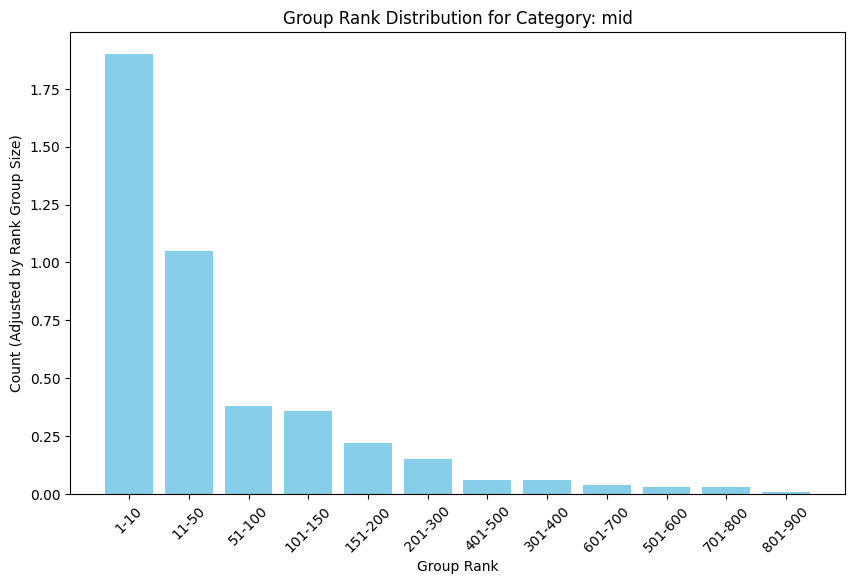

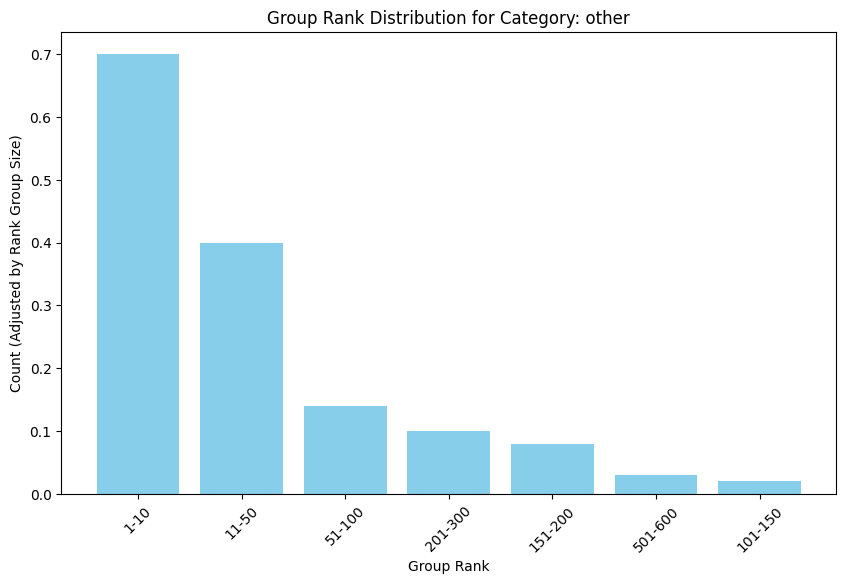

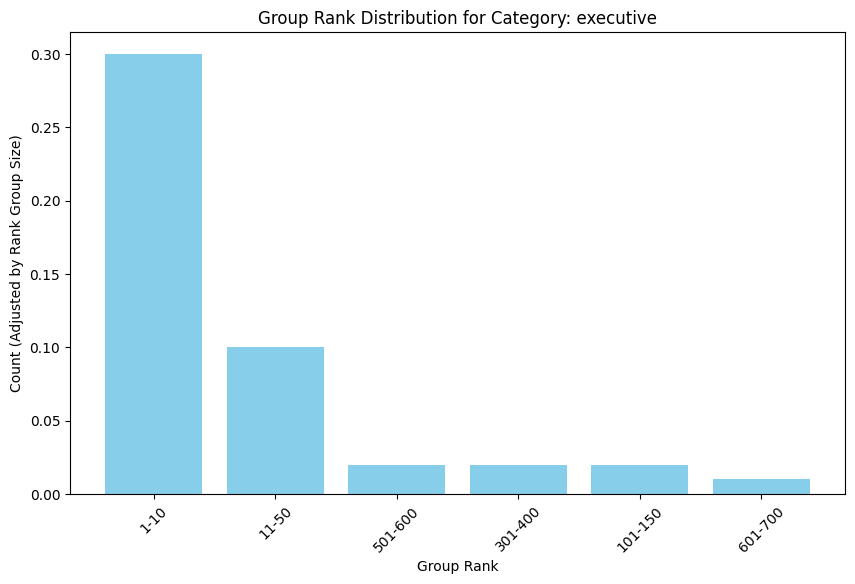

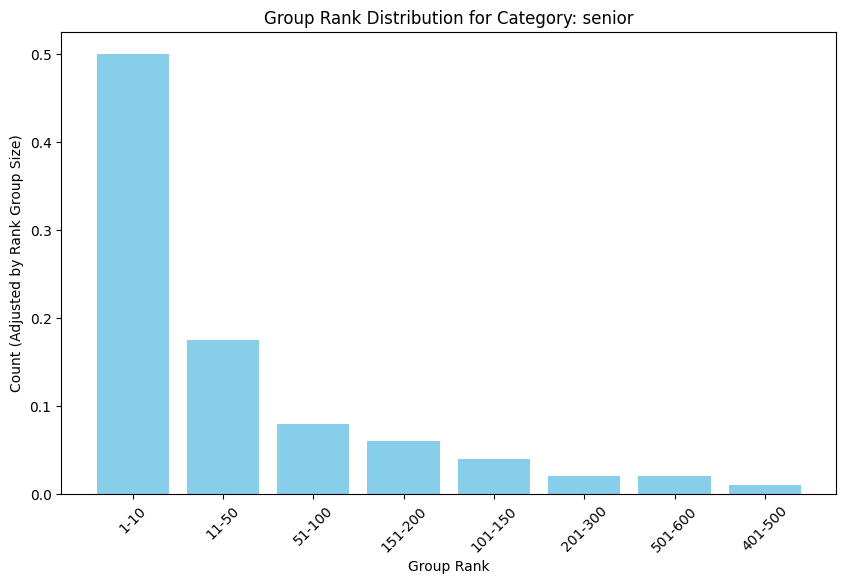

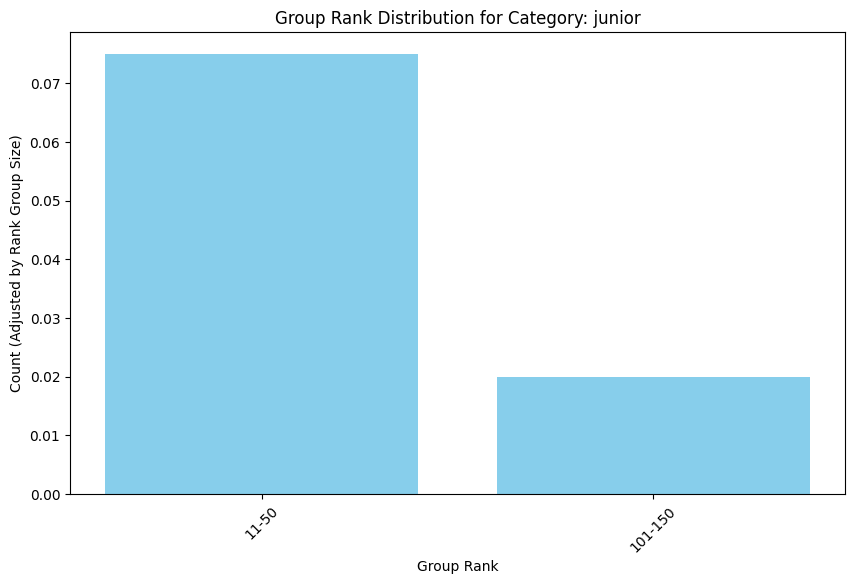

In [0]:
import matplotlib.pyplot as plt

# Define the size of each rank group
rank_group_sizes = {
    "1-10": 10,
    "11-50": 40,
    "51-100": 50,
    "101-150": 50,
    "151-200": 50,
    "201-300": 100,
    "301-400": 100,
    "401-500": 100,
    "501-600": 100,
    "601-700": 100,
    "701-800": 100,
    "801-900": 100,
    "901-1000": 100,
}

# Filter out 'other' rank group and prepare data for plotting
filtered_highest_category_dfs_normalized = {category: df.filter(col("group_rank") != "other") for category, df in highest_degree_dfs.items()}

# Plot the rank group for each category
for category, df in filtered_highest_category_dfs_normalized.items():
    rank_group_counts = df.groupBy("group_rank").count().orderBy("count", ascending=False).collect()
    rank_groups = [row['group_rank'] for row in rank_group_counts]
    counts = [row['count'] for row in rank_group_counts]
    
    # Adjust counts by the size of each rank group
    adjusted_counts = [count / rank_group_sizes[rank_group] for count, rank_group in zip(counts, rank_groups)]

    # Sort rank groups and adjusted counts in descending order
    sorted_rank_groups_counts = sorted(zip(rank_groups, adjusted_counts), key=lambda x: x[1], reverse=True)
    sorted_rank_groups = [item[0] for item in sorted_rank_groups_counts]
    sorted_adjusted_counts = [item[1] for item in sorted_rank_groups_counts]

    plt.figure(figsize=(10, 6))
    plt.bar(sorted_rank_groups, sorted_adjusted_counts, color='skyblue')
    plt.xlabel('Group Rank')
    plt.ylabel('Count (Adjusted by Rank Group Size)')
    plt.title(f'Group Rank Distribution for Category: {category}')
    plt.xticks(rotation=45)
    plt.show()

In [0]:
from pyspark.sql.types import IntegerType
from pyspark.sql.functions import when, col, udf

# 1) Define a new rank-group to multiplier mapping
multiplier_mapping = {
    "1-10": 20,
    "11-50": 15,
    "51-100": 12,
    "101-150": 10,
    "151-200": 8,
    "201-300": 6,
    "301-400": 4,
    "401-500": 3,
    "501-600": 2,
    "601-700": 2,
    "701-800": 2,
    "801-900": 2,
    "901-1000": 1
}

# 2) Create a UDF to fetch the multiplier for each rank_group
@udf(IntegerType())
def multiplier_udf(rank_group):
    """
    Returns the multiplier based on the rank_group. 
    If rank_group is null or not in the dictionary, defaults to 1.
    """
    if not rank_group:
        return 1
    return multiplier_mapping.get(rank_group.strip(), 1)

# 3) Assign larger gaps between degree types
degree_values = {
    "bachelor": 3,
    "masters": 6,
    "phd": 10,
    "other": 1
}

# 4) Initialize a new dictionary to store the DataFrames with education scores
category_dfs_edu_score = {}

# 5) Compute an education score for each user in category_dfs_with_divded_degrees,
#    excluding the "other" degree from the cumulative score
for category, df in category_dfs_with_divded_degrees.items():
    df_with_score = df \
        .withColumn(
            "bachelor_score",
            when(col("bachelor_university").isNotNull(),
                 degree_values["bachelor"] * multiplier_udf(col("bachelor_rank_group"))
            ).otherwise(0)
        ) \
        .withColumn(
            "masters_score",
            when(col("masters_university").isNotNull(),
                 degree_values["masters"] * multiplier_udf(col("masters_rank_group"))
            ).otherwise(0)
        ) \
        .withColumn(
            "phd_score",
            when(col("phd_university").isNotNull(),
                 degree_values["phd"] * multiplier_udf(col("phd_rank_group"))
            ).otherwise(0)
        ) \
        .withColumn(
            "other_score",
            when(col("other_university").isNotNull(),
                 degree_values["other"] * multiplier_udf(col("other_rank_group"))
            ).otherwise(0)
        ) \
        .withColumn(
            # Exclude "other_score" from the cumulative education_score
            "education_score",
            col("bachelor_score") + col("masters_score") + col("phd_score")
        )

    # Filter out rows where the user has no bachelor, masters, or PhD degrees.
    # This filters out people who only have "other" degrees or no degree at all.
    df_filtered = df_with_score.filter(
        (col("bachelor_score") > 0) | 
        (col("masters_score") > 0) | 
        (col("phd_score") > 0)
    )

    # Save the processed DataFrame to the new dictionary
    category_dfs_edu_score[category] = df_filtered

    # Display for verification (optional)
    df_filtered.select("id", "title", "education_score").show(truncate=False)

# At this point, category_dfs_edu_score holds the DataFrames with computed education scores for each category.

+----------------------------+----------------------------------------------------------------------------------+---------------+
|id                          |title                                                                             |education_score|
+----------------------------+----------------------------------------------------------------------------------+---------------+
|catherine-eng-73b095a       |public policy manager, meta | aspen strategy group rising leader | cfr term member|135            |
|chrissy-kane-13b6a84        |talent manager @ meta | technical recruiting leader for swe, product, design      |3              |
|sampurnabasu                |software engineer at meta                                                         |108            |
|weiwunwu                    |engineering manager at meta                                                       |195            |
|mtmcgough                   |data scientist @ meta | chicago booth mba                   

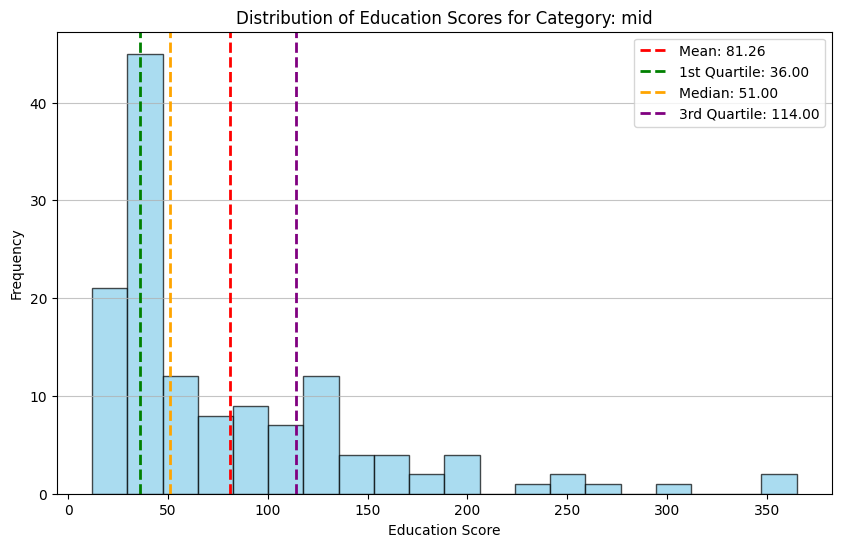

Category: mid
Mean Education Score: 81.26
1st Quartile (25th percentile): 36.00
Median (50th percentile): 51.00
3rd Quartile (75th percentile): 114.00
--------------------------------------------------


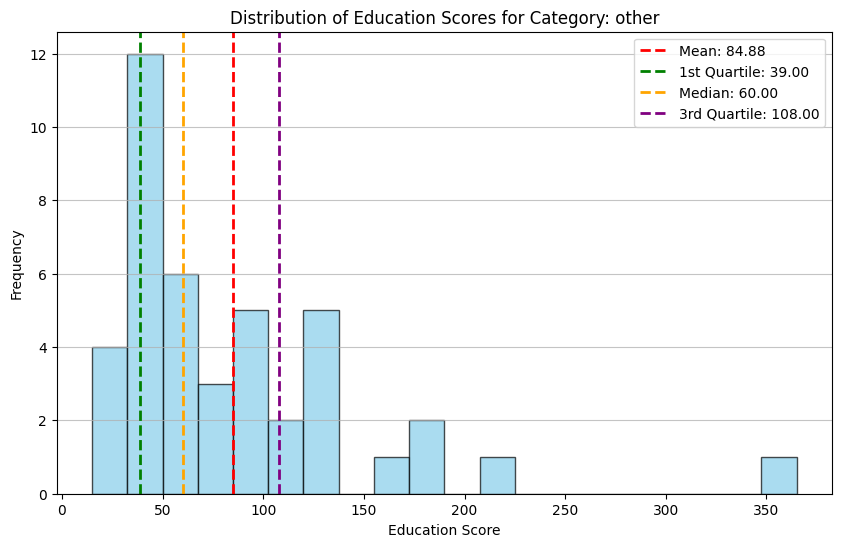

Category: other
Mean Education Score: 84.88
1st Quartile (25th percentile): 39.00
Median (50th percentile): 60.00
3rd Quartile (75th percentile): 108.00
--------------------------------------------------


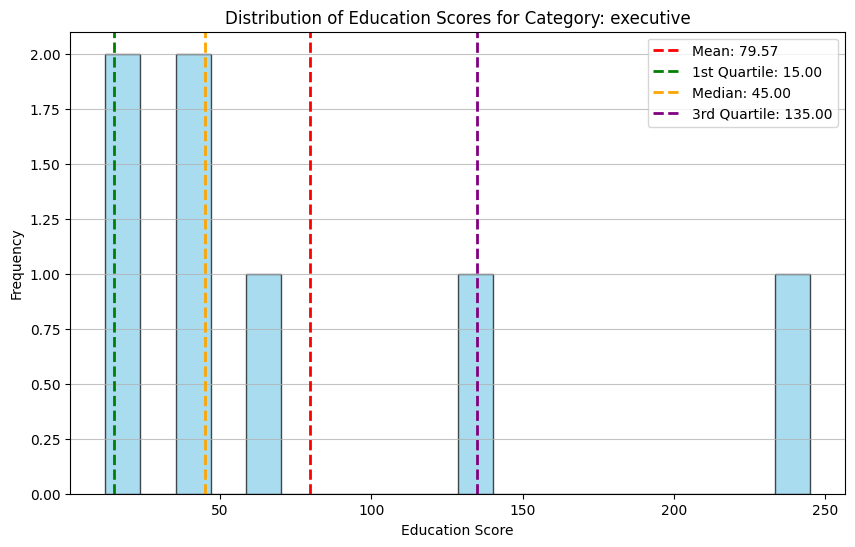

Category: executive
Mean Education Score: 79.57
1st Quartile (25th percentile): 15.00
Median (50th percentile): 45.00
3rd Quartile (75th percentile): 135.00
--------------------------------------------------


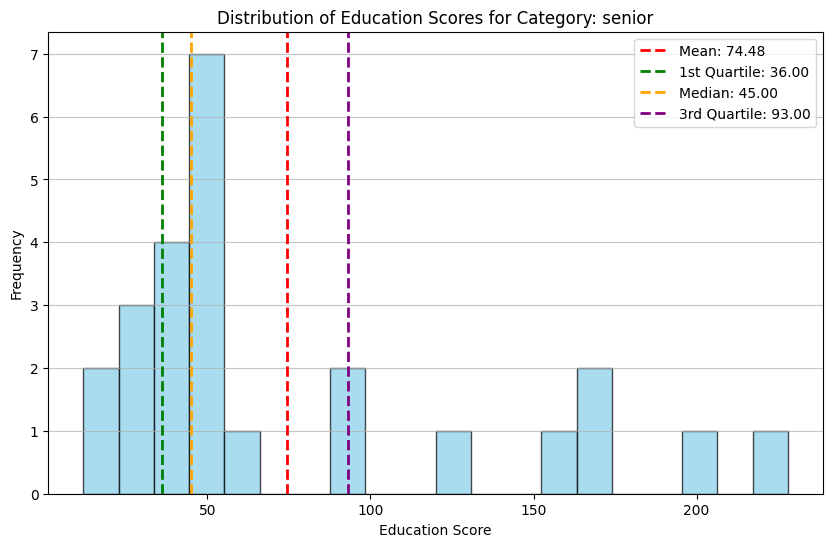

Category: senior
Mean Education Score: 74.48
1st Quartile (25th percentile): 36.00
Median (50th percentile): 45.00
3rd Quartile (75th percentile): 93.00
--------------------------------------------------


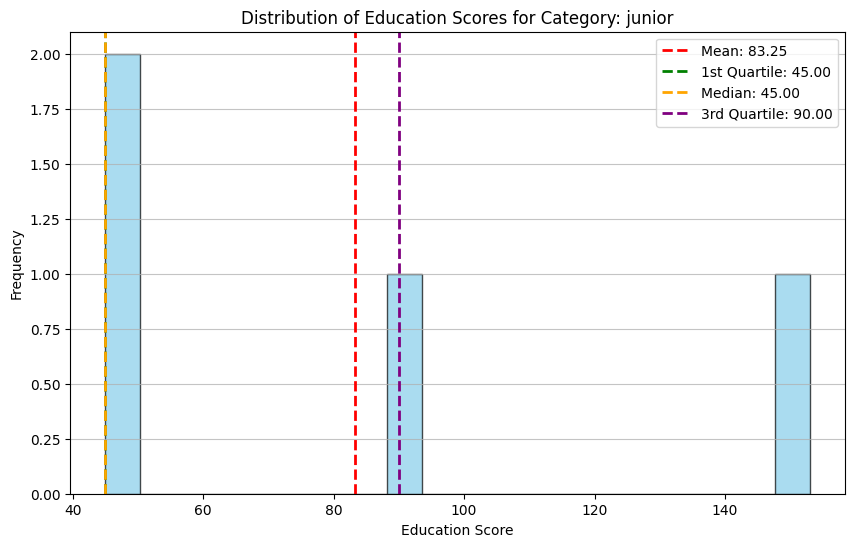

Category: junior
Mean Education Score: 83.25
1st Quartile (25th percentile): 45.00
Median (50th percentile): 45.00
3rd Quartile (75th percentile): 90.00
--------------------------------------------------


In [0]:
import matplotlib.pyplot as plt
from pyspark.sql.functions import col, mean, expr
import pandas as pd

# Initialize matplotlib for better display in some environments
%matplotlib inline

for category, df in category_dfs_edu_score.items():
    # 1) Filter out rows where education_score is 0 or below threshold
    df_filtered = df.filter(col("education_score") > 10)
    
    # Check if the filtered DataFrame is empty
    if df_filtered.rdd.isEmpty():
        print(f"No education scores above 25 for category: {category}")
        continue
    
    # 2) Compute statistical metrics using Spark
    stats = df_filtered.select(
        mean(col("education_score")).alias("mean_score"),
        expr("percentile_approx(education_score, 0.25)").alias("first_quartile"),
        expr("percentile_approx(education_score, 0.5)").alias("median"),
        expr("percentile_approx(education_score, 0.75)").alias("third_quartile")
    ).collect()[0]
    
    mean_score = stats["mean_score"]
    first_quartile = stats["first_quartile"]
    median = stats["median"]
    third_quartile = stats["third_quartile"]
    
    # 3) Convert the filtered DataFrame to Pandas for plotting
    pdf = df_filtered.select("education_score").toPandas()
    
    # 4) Plot the histogram
    plt.figure(figsize=(10, 6))
    n, bins, patches = plt.hist(pdf["education_score"], bins=20, alpha=0.7, color='skyblue', edgecolor='black')
    
    # 5) Add vertical lines for mean and quartiles
    plt.axvline(mean_score, color='red', linestyle='dashed', linewidth=2, label=f"Mean: {mean_score:.2f}")
    plt.axvline(first_quartile, color='green', linestyle='dashed', linewidth=2, label=f"1st Quartile: {first_quartile:.2f}")
    plt.axvline(median, color='orange', linestyle='dashed', linewidth=2, label=f"Median: {median:.2f}")
    plt.axvline(third_quartile, color='purple', linestyle='dashed', linewidth=2, label=f"3rd Quartile: {third_quartile:.2f}")
    
    # 6) Customize the plot
    plt.title(f"Distribution of Education Scores for Category: {category}")
    plt.xlabel("Education Score")
    plt.ylabel("Frequency")
    plt.grid(axis='y', alpha=0.75)
    plt.legend()
    
    # 7) Display the plot
    plt.show()
    
    # 8) Print the statistical metrics
    print(f"Category: {category}")
    print(f"Mean Education Score: {mean_score:.2f}")
    print(f"1st Quartile (25th percentile): {first_quartile:.2f}")
    print(f"Median (50th percentile): {median:.2f}")
    print(f"3rd Quartile (75th percentile): {third_quartile:.2f}")
    print("-" * 50)


### Start of feature 5 - most common degree types for each position rank ###

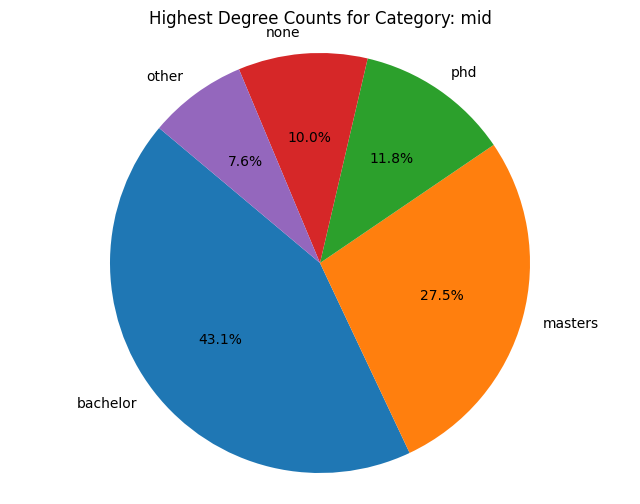

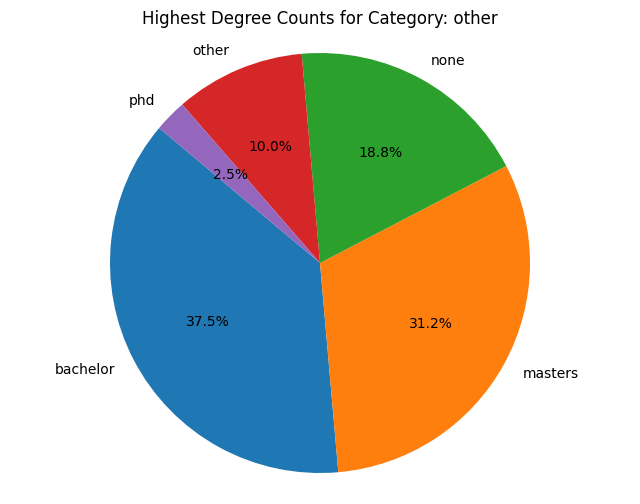

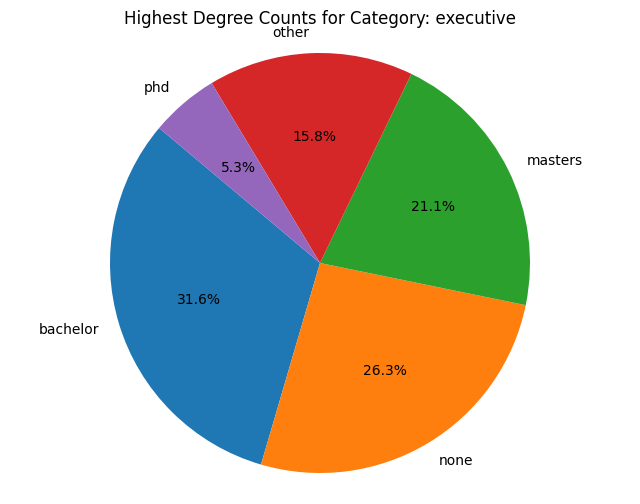

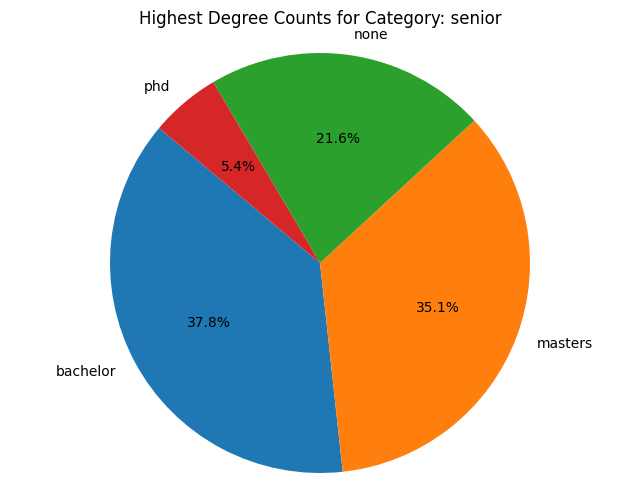

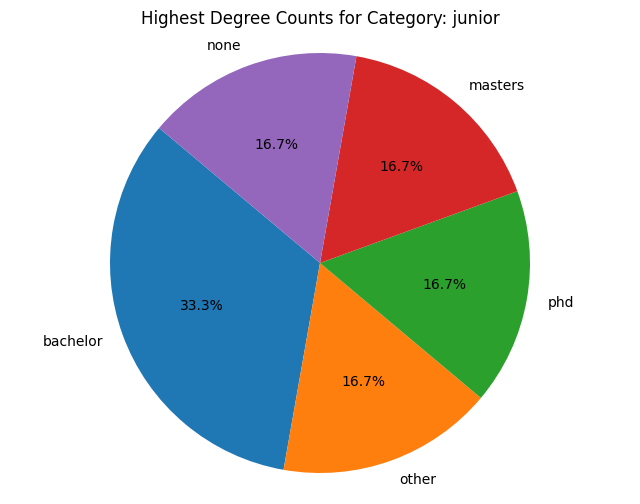

In [0]:
from pyspark.sql.functions import when, col, lit
import matplotlib.pyplot as plt

# Dictionary to store count results per category
highest_degree_counts_per_category = {}

for category, df in category_dfs_with_divded_degrees.items():
    # Determine the highest degree category for each person based on non-null columns
    df_highest = df.withColumn(
        "highest_degree_category",
        when(col("phd_degree").isNotNull(), lit("phd"))
        .when(col("masters_degree").isNotNull(), lit("masters"))
        .when(col("bachelor_degree").isNotNull(), lit("bachelor"))
        .when(col("other_degree").isNotNull(), lit("other"))
        .otherwise(lit("none"))
    )
    
    # Group by the highest degree category and count occurrences
    degree_counts = df_highest.groupBy("highest_degree_category") \
                              .count() \
                              .orderBy(col("count").desc())
    
    highest_degree_counts_per_category[category] = degree_counts
    
    # Convert to Pandas DataFrame for plotting
    degree_counts_pd = degree_counts.toPandas()
    
    # Plot pie chart
    plt.figure(figsize=(8, 6))
    plt.pie(degree_counts_pd['count'], labels=degree_counts_pd['highest_degree_category'], autopct='%1.1f%%', startangle=140)
    plt.title(f"Highest Degree Counts for Category: {category}")
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    plt.show()

#### most common degree-field combinations, divded by rank and field ####

In [0]:
import re
from pyspark.sql.functions import col, lower, udf, collect_list, struct
from pyspark.sql.types import StringType

# --- 1. Filter DataFrame using PySpark operations ---
company_pattern = rf"ex[-\s]?{company_name_1.lower()}|x[-\s]?{company_name_1.lower()}"

filtered_df = employee_profile_links_df \
    .select(col("id"), col("current_company.title").alias("title")) \
    .na.drop(subset=["title"]) \
    .withColumn("title", lower(col("title"))) \
    .filter(col("title").contains(company_name_1.lower())) \
    .filter(~col("title").rlike(company_pattern))
    


# --- 2. Define field terms and precompile regex patterns ---
field_terms = {
    'engineering': [
        'engineer', 'eng', 'developer', 'dev', 'programmer', 'prog', 
        'software', 'software engineer', 'software developer', 'sde', 'swe',
        'hardware', 'architect', 'devops', 'sre', 'quality assurance', 'qa', 
        'embedded', 'firmware', 'frontend', 'front end', 'backend', 'back end', 
        'full stack', 'systems', 'system', 'platform', 'application', 
        'it engineer', 'site reliability'
    ],
    'data': [
        'data scientist', 'data sci', 'ds', 'data analyst', 'data eng', 'de', 
        'machine learning', 'ml', 'ai', 'artificial intelligence', 
        'analytics', 'business intelligence', 'bi', 'big data', 'data science',
        'ml engineer', 'ai engineer', 'research scientist', 'researcher'
    ],
    'human_resources': [
        'human resources', 'hr', 'hrm', 'recruiter', 'talent', 'people ops', 
        'people operations', 'talent acquisition', 'hr business partner', 
        'hrbp', 'hr partner', 'recruiting', 'talent manager', 'hr specialist'
    ],
    'sales': [
        'sales', 'account manager', 'biz dev', 'business development', 
        'account executive', 'sales manager', 'client relationship', 
        'sales rep', 'salesperson', 'bd', 'bdm'
    ],
    'marketing': [
        'marketing', 'marketer', 'brand', 'seo', 'content', 'social media', 
        'digital marketing', 'growth', 'campaign', 'market research', 
        'marcom', 'marketing manager', 'brand manager', 'content creator'
    ],
    'product': [
        'product manager', 'pm', 'product owner', 'product designer', 
        'product lead', 'product director', 'prod mgr', 'pd', 'pmo'
    ],
    'legal': [
        'legal', 'counsel', 'lawyer', 'attorney', 'compliance', 
        'solicitor', 'paralegal', 'corporate counsel', 'legal advisor'
    ],
    'finance': [
        'finance', 'accountant', 'financial', 'controller', 
        'financial analyst', 'treasurer', 'cfo', 'cp', 'cpa', 'fp&a', 
        'finance manager', 'fiscal'
    ],
    'operations': [
        'operations', 'ops', 'logistics', 'supply chain', 
        'operations manager', 'project manager', 'program manager', 
        'supply chain manager', 'ops mgr', 'operations lead'
    ],
    'support': [
        'support', 'customer service', 'technical support', 
        'help desk', 'customer care', 'it support', 'support engineer', 
        'customer support', 'service desk'
    ]
}

field_patterns = {}
for field, terms in field_terms.items():
    escaped_terms = [re.escape(term.lower()) for term in terms]
    field_patterns[field] = re.compile(r'\b(' + '|'.join(escaped_terms) + r')\b')

# --- 3. Define professional terms and precompile regex patterns ---
professional_terms = {
    'executive': [
        'executive', 'director', 'vp', 'vice president', 
        'chief', 'ceo', 'cfo', 'coo', 'cto', 'cio', 
        'founder', 'partner', 'president', 'owner', 
        'principal', 'board', 'chair', 'chairman', 
        'managing director', 'chief executive', 'chief scientist', 
        'director of research', 'head of science'
    ],
    'senior': [
        'senior', 'lead', 'principal', 'head', 'sr.', 'sr', 
        'staff', 'chief', 'director', 'executive director',
        'architect', 'senior manager', 'senior engineer', 
        'senior consultant', 'senior specialist', 'sr', 
        'lead', 'principal', 'senior scientist', 
        'lead scientist', 'principal scientist', 'staff scientist'
    ],
    'mid': [
        'manager', 'supervisor', 'specialist', 'consultant', 
        'coordinator', 'analyst', 'engineer', 'designer', 
        'developer', 'project manager', 'team lead', 
        'associate manager', 'mid-level', 'software engineer', 
        'business analyst', 'product manager', 'account manager', 
        'researcher', 'program manager', 'technical program manager', 
        'scientist', 'research scientist', 'data scientist', 
        'laboratory scientist', 'biologist', 'physicist', 
        'chemist', 'scientist ii', 'scientist iii'
    ],
    'junior': [
        'junior', 'associate', 'assistant', 'entry', 'intern',
        'trainee', 'apprentice', 'new grad', 'entry-level', 
        'junior scientist', 'assistant scientist', 'research assistant'
    ]
}

rank_patterns = {}
for rank, terms in professional_terms.items():
    escaped_terms = [re.escape(term.lower()) for term in terms]
    rank_patterns[rank] = re.compile(r'\b(' + '|'.join(escaped_terms) + r')\b')

# --- 4. Broadcast the regex patterns to workers ---
broadcast_field_patterns = sc.broadcast(field_patterns)
broadcast_rank_patterns = sc.broadcast(rank_patterns)

# --- 5. Create UDFs for categorizing titles ---
def categorize_field(title):
    patterns = broadcast_field_patterns.value
    for field, pattern in patterns.items():
        if pattern.search(title):
            return field
    return "other"

def categorize_rank(title):
    patterns = broadcast_rank_patterns.value
    for rank, pattern in patterns.items():
        if pattern.search(title):
            return rank
    return "other"

field_udf = udf(categorize_field, StringType())
rank_udf = udf(categorize_rank, StringType())

# --- 6. Apply the UDFs to add 'field_category' and 'rank_category' columns ---
categorized_field_rank_df = filtered_df \
    .withColumn("field_category", field_udf(col("title"))) \
    .withColumn("rank_category", rank_udf(col("title")))

# --- 7. (Optional) Group data by field and rank ---
grouped_field_rank_data = categorized_field_rank_df \
    .groupBy("field_category", "rank_category") \
    .agg(
        collect_list(struct("id", "title")).alias("employees")
    )

# --- 8. Save the new DataFrame under a new meaningful name ---
categorized_by_field_and_rank_df = categorized_field_rank_df

# (Optional) If you performed grouping, you might want to save that as well:
# categorized_grouped_field_rank_df = grouped_field_rank_data

# Display the final categorized DataFrame
display(categorized_by_field_and_rank_df)


id,title,field_category,rank_category
jay-burgess-57b5342,"director, accounting controllership @meta (f.k.a facebook)",other,executive
chrissy-kane-13b6a84,"talent manager @ meta | technical recruiting leader for swe, product, design",engineering,mid
summer-than-067b888b,software engineer at meta,engineering,mid
mtmcgough,data scientist @ meta | chicago booth mba,data,mid
max-li-0844323a,software engineer at meta,engineering,mid
ajwaters1218,problem integrity at meta,other,other
nishita-aggarwal,software engineer at meta|ex-googler,engineering,mid
mirasarkis,research & ads measurement at meta,other,other
rachel-rankin-0035063a,staff security engineer at meta,engineering,senior
james-sun-4812ba15,"product marketing @ meta | brand builder | shopper marketing | sales | cpg (ex philips, nestle) | rmn",sales,other


In [0]:
%pip install rapidfuzz

import re
from pyspark.sql.functions import concat, lit, col, lower, udf, expr, size, collect_list, struct
from pyspark.sql.types import StringType, StructType, StructField, ArrayType, IntegerType
from rapidfuzz.fuzz import ratio as rapid_fuzz_ratio
from rapidfuzz.fuzz import partial_ratio as rapid_fuzz_partial_ratio
from pyspark.sql import SparkSession, Row

# Initialize SparkSession if not already done
spark = SparkSession.builder.appName("FieldRankDegreeProcessing").getOrCreate()

# 1. Perform the join and filter for entries with non-empty education
joined_status_df = categorized_by_field_and_rank_df.join(
    employee_profile_links_df.select('id', 'education'), 
    on='id', 
    how='left'
)

filtered_status_df = joined_status_df.filter(size(col("education")) > 0)

# 2. Create columns for university and field of study for each degree type using regex with rlike
filtered_status_df = filtered_status_df \
    .withColumn(
        "bachelor_university",
        expr("""
            filter(`education`, 
                   x -> lower(x.degree) rlike '(bachelor|b\\.s\\.?|bs)'
            )[0].title
        """)
    ) \
    .withColumn(
        "bachelor_degree",
        expr("""
            filter(`education`, 
                   x -> lower(x.degree) rlike '(bachelor|b\\.s\\.?|bs)'
            )[0].field
        """)
    ) \
    .withColumn(
        "masters_university",
        expr("""
            filter(`education`, 
                   x -> lower(x.degree) rlike '(master|m\\.s\\.?|ms)'
            )[0].title
        """)
    ) \
    .withColumn(
        "masters_degree",
        expr("""
            filter(`education`, 
                   x -> lower(x.degree) rlike '(master|m\\.s\\.?|ms)'
            )[0].field
        """)
    ) \
    .withColumn(
        "phd_university",
        expr("""
            filter(`education`, 
                   x -> lower(x.degree) rlike '(phd|ph\\.d\\.?|doctorate)'
            )[0].title
        """)
    ) \
    .withColumn(
        "phd_degree",
        expr("""
            filter(`education`, 
                   x -> lower(x.degree) rlike '(phd|ph\\.d\\.?|doctorate)'
            )[0].field
        """)
    ) \
    .withColumn(
        "other_university",
        expr("""
            filter(`education`, 
                   x -> NOT(lower(x.degree) rlike '(bachelor|b\\.s\\.?|bs)') 
                     AND NOT(lower(x.degree) rlike '(master|m\\.s\\.?|ms)') 
                     AND NOT(lower(x.degree) rlike '(phd|ph\\.d\\.?|doctorate)')
            )[0].title
        """)
    ) \
    .withColumn(
        "other_degree",
        expr("""
            filter(`education`, 
                   x -> NOT(lower(x.degree) rlike '(bachelor|b\\.s\\.?|bs)') 
                     AND NOT(lower(x.degree) rlike '(master|m\\.s\\.?|ms)') 
                     AND NOT(lower(x.degree) rlike '(phd|ph\\.d\\.?|doctorate)')
            )[0].field
        """)
    )

# 3. Define degree processing function
def process_degrees(df, field, rank):
    """
    Process degrees for a specific field and rank.
    
    Args:
        df (DataFrame): Input DataFrame filtered by field and rank.
        field (str): Field category.
        rank (str): Rank category.
        
    Returns:
        DataFrame: Processed DataFrame with cleaned degree_field_pair_clean.
    """
    # Define degree types and their prefixes
    degree_types = {
        'bachelor_degree': 'bachelor in ',
        'masters_degree': 'masters in ',
        'phd_degree': 'phd in ',
        'other_degree': 'other in '
    }
    
    # Create degree_field_pair column
    degree_dfs = []
    for degree_col, prefix in degree_types.items():
        degree_df = df.filter(col(degree_col).isNotNull()) \
                     .select("id", "title", 
                             concat(lit(prefix), lower(col(degree_col)))
                             .alias("degree_field_pair"))
        degree_dfs.append(degree_df)
    
    # Union all degree-specific DataFrames
    union_df = degree_dfs[0]
    for ddf in degree_dfs[1:]:
        union_df = union_df.union(ddf)
    
    # Collect distinct degree_field_pairs
    distinct_pairs = [row["degree_field_pair"] for row in union_df.select("degree_field_pair").distinct().collect()]
    
    # Fuzzy matching to group similar degree_field_pairs
    similarity_threshold = 90  # Adjust threshold as needed
    groups = {}
    for pair in distinct_pairs:
        found = False
        for key in list(groups.keys()):  # Use list to avoid RuntimeError due to dictionary size change
            # Using rapidfuzz for better performance
            if (rapid_fuzz_ratio(pair, key) > similarity_threshold or 
                pair.startswith(key) or 
                key.startswith(pair) or
                rapid_fuzz_partial_ratio(pair, key) > similarity_threshold):
                groups[key].append(pair)
                found = True
                break
        if not found:
            groups[pair] = [pair]
    
    # Create a mapping from each similar string to its canonical representative
    mapping = {}
    for canonical, similars in groups.items():
        for similar in similars:
            mapping[similar] = canonical
    
    # Broadcast the mapping to all worker nodes
    broadcast_map = spark.sparkContext.broadcast(mapping)
    
    # Define a UDF to map degree_field_pair using the broadcasted dictionary
    def map_degree_field(s):
        return mapping.get(s, s)
    
    map_udf = udf(map_degree_field, StringType())
    
    # Apply the UDF to create a cleaned degree_field_pair column
    union_df = union_df.withColumn("degree_field_pair_clean", map_udf(col("degree_field_pair")))
    
    # Group by the cleaned degree-field combination and count occurrences
    degree_field_counts = union_df.groupBy("degree_field_pair_clean") \
                                  .count() \
                                  .orderBy(col("count").desc())
    
    return degree_field_counts, union_df

# 4. Define title merging functions
def get_common_prefix_suffix(titles):
    if not titles:
        return "", ""
    split_titles = [title.split() for title in titles]
    # Find common prefix
    prefix = []
    for words in zip(*split_titles):
        if all(word == words[0] for word in words):
            prefix.append(words[0])
        else:
            break
    # Find common suffix
    suffix = []
    for words in zip(*[title[::-1] for title in split_titles]):
        if all(word == words[0] for word in words):
            suffix.append(words[0])
        else:
            break
    suffix = suffix[::-1]  # Reverse back the suffix
    return " ".join(prefix), " ".join(suffix)

def create_meaningful_merged_title(titles):
    if len(titles) == 1:
        return titles[0]
    prefix, suffix = get_common_prefix_suffix(titles)
    # Extract unique middle parts
    middle_parts = []
    for title in titles:
        stripped_title = title[len(prefix):].strip() if prefix else title
        stripped_title = stripped_title[:-len(suffix)].strip() if suffix else stripped_title
        middle_parts.append(stripped_title)
    unique_middle_parts = sorted(set(middle_parts))
    
    # Combine prefix, unique middle parts, and suffix without unwanted slashes
    parts = []
    if prefix:
        parts.append(prefix)
    if unique_middle_parts:
        parts.append(' / '.join(unique_middle_parts))
    if suffix:
        parts.append(suffix)
    
    merged_title = ' '.join(parts).strip()
    return merged_title

def group_similar_titles_with_meaningful_merging(df):
    degree_prefix_words = {"bachelor", "masters", "phd", "other", "in"}
    
    # Collect titles and counts
    titles = df.select("degree_field_pair_clean", "count").collect()
    grouped = []

    for row in titles:
        title = row['degree_field_pair_clean']
        count = int(row['count'])
        found_group = False

        for group in grouped:
            if rapid_fuzz_ratio(title.lower(), group['title'].lower()) > 75:
                title_tokens = set(title.lower().split()) - degree_prefix_words
                group_tokens = set(group['title'].lower().split()) - degree_prefix_words
                if title_tokens & group_tokens:
                    group['count'] += count
                    group['merged_titles'].append(title)
                    group['title'] = create_meaningful_merged_title(group['merged_titles'])
                    found_group = True
                    break

        if not found_group:
            grouped.append({'title': title, 'count': count, 'merged_titles': [title]})
    
    return grouped

# 5. Process Data by Field and Rank to Extract Top 3 Degree-Field Combinations
# List to store the final results
final_results = []

# Get distinct (field, rank) pairs
field_rank_pairs = filtered_status_df.select("field_category", "rank_category").distinct().collect()

for pair in field_rank_pairs:
    field = pair['field_category']
    rank = pair['rank_category']
    print(f"Processing Field: {field}, Rank: {rank}")
    
    # Filter DataFrame for the current (field, rank) pair
    filtered_df = filtered_status_df.filter(
        (col("field_category") == field) & (col("rank_category") == rank)
    )
    
    # Check if the filtered DataFrame has any degree information
    degree_columns = ['bachelor_degree', 'masters_degree', 'phd_degree', 'other_degree']
    has_degree_info = any(
        col_name in filtered_df.columns and
        filtered_df.filter(col(col_name).isNotNull()).count() > 0
        for col_name in degree_columns
    )
    
    if not has_degree_info:
        print(f"No degree information available for Field: {field}, Rank: {rank}. Skipping.")
        continue
    
    # Process degrees to get degree_field_counts and cleaned union_df
    degree_field_counts_df, union_df = process_degrees(filtered_df, field, rank)
    
    # Perform meaningful merging on degree_field_pair_clean
    grouped_titles = group_similar_titles_with_meaningful_merging(degree_field_counts_df)
    
    # Collect top 3 most common combinations
    top_3 = sorted(grouped_titles, key=lambda x: x['count'], reverse=True)[:3]
    
    for group in top_3:
        final_results.append({
            'field_category': field,
            'rank_category': rank,
            'merged_title': group['title'],
            'count': group['count']
        })

# Create a final DataFrame from the results
final_schema = StructType([
    StructField("field_category", StringType(), True),
    StructField("rank_category", StringType(), True),
    StructField("merged_title", StringType(), True),
    StructField("count", IntegerType(), True)
])

final_rows = [Row(**res) for res in final_results]
final_df = spark.createDataFrame(final_rows, schema=final_schema)

# Display the final results
final_df.orderBy("field_category", "rank_category", col("count").desc()).show(truncate=False)


#### Experience quartiles ####

In [0]:
from pyspark.sql.functions import expr, lower, size, col

# 1. Perform the join and filter for entries with non-empty experience
joined_status_experience_df = status_df.join(
    employee_profile_links_df.select('id', 'experience'),
    on='id',
    how='left'
)

# Filter rows where the experience array is not empty
filtered_status_experience_df = joined_status_experience_df.filter(size(col("experience")) > 0)

# 2. Create new columns by extracting information from the experience array.
# Here we extract:
# - current_company: the company from the first experience element
# - current_position: the title from the first position in the positions array of the first experience element
filtered_status_experience_df = filtered_status_experience_df \
    .withColumn(
        "current_company",
        expr("experience[0].company")
    ) \
    .withColumn(
        "current_position",
        expr("experience[0].positions[0].title")
    )

# 3. Split the DataFrame by category.
# (Assuming the column "category" exists in status_df)
categories_experience = filtered_status_experience_df.select("category").distinct().collect()
category_dfs_experience = {
    row['category']: filtered_status_experience_df.filter(col("category") == row['category'])
    for row in categories_experience
}

# Display each category's DataFrame
for category, df in category_dfs_experience.items():
    display(df)


id title category experience current_company current_position catherine-eng-73b095a public policy manager, meta | aspen strategy group rising leader | cfr term member mid List(List(null, null, null, Mar 2021 - Present 2 years 7 months, 2 years 7 months, Present, null, null, Mar 2021, Meta, https://bd.linkedin.com/company/meta?trk=public_profile_experience-item_profile-section-card_subtitle-click, Public Policy Manager, Executive Branch, US Policy, null), List(null, null, null, Jun 2020 - Present 3 years 4 months, 3 years 4 months, Present, null, null, Jun 2020, Council on Foreign Relations, https://bd.linkedin.com/company/council-on-foreign-relations?trk=public_profile_experience-item_profile-section-card_subtitle-click, Term Member, null), List(null, null, Jigsaw is a unit within Google that forecasts emerging digital threats and builds technology to confront some of the world's toughest global security challenges. Jigsaw is a unit within Google that forecasts emerging digital threats and builds technology to confront some of the world's toughest global security challenges., Jan 2019 Feb 2021 2 years 2 months, 2 years 2 months, Feb 2021, New York, NY, null, Jan 2019, Google, https://bd.linkedin.com/company/google?trk=public_profile_experience-item_profile-section-card_subtitle-click, China Policy Associate, null), List(null, null, Samm Sacks is a cyber policy fellow at New America. Her research examines information and communication technology policies globally with a focus on China. She publishes, testifies, and presents regularly on topics related to the US-China technology relationship and the geopolitics of data privacy and cross-border data flows. Samm Sacks is a cyber policy fellow at New America. Her research examines information and communication technology policies globally with a focus on China. She publishes, testifies, and presents regularly on topics related to the US-China technology relationship and the geopolitics of data privacy and cross-border data flows., Sep 2018 Jan 2019 5 months, 5 months, Jan 2019, New York, NY, null, Sep 2018, Center for Strategic and International Studies (CSIS), https://bd.linkedin.com/company/csis?trk=public_profile_experience-item_profile-section-card_subtitle-click, Researcher to Samm Sacks, Senior Fellow in Technology Policy (China focus), null), List(null, null, The United Nations Economic and Social Council is at the heart of the UN system to advance the three dimensions of sustainable development - economic, social, and environmental. IT's the central platform for fostering debate and innovative thinking, and coordinating efforts to achieve Internationally agreed goals. It's responsible for the follow-up to major UN conferences and summits. The United Nations Economic and Social Council is at the heart of the UN system to advance the three dimensions of sustainable development - economic, social, and environmental. IT's the central platform for fostering debate and innovative thinking, and coordinating efforts to achieve Internationally agreed goals. It's responsible for the follow-up to major UN conferences and summits., Jun 2017 Aug 2017 3 months, 3 months, Aug 2017, New York, NY, null, Jun 2017, United Nations, https://bd.linkedin.com/company/united-nations?trk=public_profile_experience-item_profile-section-card_subtitle-click, MBA Summer Intern, Economic and Social Council, null), List(Rice, Hadley, Gates & Manuel, ricehadleygates-llc, null, 4 years, null, null, null, List(List(Rice, Hadley, Gates & Manuel LLC (RHGM) is a boutique international strategic consulting firm founded by former Secretary of State Condoleezza Rice, former National Security Advisor Stephen Hadley, and former Secretary of Defense Robert Gates. RHG provides consulting for American businesses to successfully expand overseas in emerging markets including China, India, and key Middle East and South East Asia countries., Dec 2013 Jun 2016 2 years 7 months, 2 years 7 months, Jun 2016, Dec 2013 - Jun 2016

id title category experience current_company current_position mirasarkis research & ads measurement at meta other List(List(Meta, meta, null, 5 years 9 months, null, null, null, List(List(• Creating industry leading customer and consumer insights through global qual and quant research within the CPG industry• Researching consumer behavior as it relates to online advertisement and social media usage• Analyzing the role social media apps play in the consumer journey, from discovery to purchase • Providing marketers with actionable strategies and recommendations based on consumer trends, Dec 2019 - Present 3 years 10 months, 3 years 10 months, Present, Dec 2019 - Present3 years 10 months , Greater Seattle Area , • Creating industry leading customer and consumer insights through global qual and quant research within the CPG industry• Researching consumer behavior as it relates to online advertisement and social media usage• Analyzing the role social media apps play in the consumer journey, from discovery to purchase • Providing marketers with actionable strategies and recommendations based on consumer trends, Dec 2019, Meta, Vertical Research Lead, CPG), List(null, Jan 2018 Dec 2019 2 years, 2 years, Dec 2019, Jan 2018 - Dec 20192 years , Greater Seattle Area, Jan 2018, Meta, Marketing Science Partner, Ads Measurement)), null, null, null, null, https://cl.linkedin.com/company/meta?trk=public_profile_experience-group-header), List(Avvo, avvo, null, 2 years, null, null, null, List(List(null, May 2017 Jan 2018 9 months, 9 months, Jan 2018, May 2017 - Jan 20189 months , Greater Seattle Area, May 2017, Avvo, Marketing Analytics Manager), List(null, Feb 2016 May 2017 1 year 4 months, 1 year 4 months, May 2017, Feb 2016 - May 20171 year 4 months , Greater Seattle Area, Feb 2016, Avvo, Business Analyst, Marketing)), null, null, null, null, https://cl.linkedin.com/company/avvo?trk=public_profile_experience-group-header), List(Ipsos, ipsos, null, 5 years 1 month, null, null, null, List(List(null, Sep 2015 Jan 2016 5 months, 5 months, Jan 2016, Sep 2015 - Jan 20165 months , Bellevue, WA, Sep 2015, Ipsos, Senior Market Research Manager), List(null, Jun 2014 Sep 2015 1 year 4 months, 1 year 4 months, Sep 2015, Jun 2014 - Sep 20151 year 4 months , Bellevue, WA, Jun 2014, Ipsos, Research Manager), List(null, Jul 2013 Jun 2014 1 year, 1 year, Jun 2014, Jul 2013 - Jun 20141 year , Bellevue, WA, Jul 2013, Ipsos, Senior Research Analyst), List(null, Jan 2011 Jun 2013 2 years 6 months, 2 years 6 months, Jun 2013, Jan 2011 - Jun 20132 years 6 months , Bellevue, WA, Jan 2011, Ipsos, Research Analyst)), null, null, null, null, https://cl.linkedin.com/company/ipsos?trk=public_profile_experience-group-header)) Meta Vertical Research Lead, CPG ajwaters1218 problem integrity at meta other List(List(null, null, null, Jul 2022 - Present 1 year 3 months, 1 year 3 months, Present, Denver, Colorado, United States, null, Jul 2022, Meta, https://cz.linkedin.com/company/meta?trk=public_profile_experience-item_profile-section-card_subtitle-click, Project Manager, null), List(null, null, null, Sep 2019 Feb 2022 2 years 6 months, 2 years 6 months, Feb 2022, Greater Denver Area, null, Sep 2019, Accenture, https://cz.linkedin.com/company/accenture?trk=public_profile_experience-item_profile-section-card_subtitle-click, Senior Technology Analyst, null), List(null, null, null, Aug 2018 May 2019 10 months, 10 months, May 2019, Fort Collins, Colorado Area, null, Aug 2018, Colorado State University College of Business, https://cz.linkedin.com/company/csu-college-of-business?trk=public_profile_experience-item_profile-section-card_subtitle-click, Lab Technician, null), List(null, null, null, May 2018 Aug 2018 4 months, 4 months, Aug 2018, Cleveland/Akron, Ohio Area, null, May 2018, Progressive Insurance, https://cz.linkedin.com/company/progressive-insurance?trk=public_profile_experience-item_profile-section-card_subtitle-click, IT Systems Engineer Intern, null), List(null, null

id title category experience current_company current_position jay-burgess-57b5342 director, accounting controllership @meta (f.k.a facebook) executive List(List(null, null, null, Aug 2017 - Present 6 years 2 months, 6 years 2 months, Present, Denver, Colorado, United States, null, Aug 2017, Meta, https://www.linkedin.com/company/meta?trk=public_profile_experience-item_profile-section-card_subtitle-click, Director, Accounting Controllership (Content, Music, e-Commerce & Payments), null), List(null, null, null, Jul 2014 Aug 2017 3 years 2 months, 3 years 2 months, Aug 2017, Santa Clara, CA, null, Jul 2014, DataStax, https://www.linkedin.com/company/datastax?trk=public_profile_experience-item_profile-section-card_subtitle-click, Assistant Controller, null), List(null, null, null, Dec 2013 Jun 2014 7 months, 7 months, Jun 2014, Mountain View, CA, null, Dec 2013, Google, https://www.linkedin.com/company/google?trk=public_profile_experience-item_profile-section-card_subtitle-click, Hardware Revenue Accounting Lead, null), List(null, null, Lead and manage engagement teams responsible for financial statement and internal control audits for public and private Silicon Valley companies. Audits for high-tech and biotech companies include: • Facebook (including IPO) • Nektar Therapeutics • Portola Pharmaceuticals Oversee multiple teams working simultaneously on various client projects. Prepare financial statements and disclosures for privately-held companies. Review SEC filings for public clients, ensuring compliance with U.S generally accepted accounting principles. Show less, Sep 2005 Dec 2013 8 years 4 months, 8 years 4 months, Dec 2013, Palo Alto, CA, null, Sep 2005, Ernst & Young, https://www.linkedin.com/company/ernstandyoung?trk=public_profile_experience-item_profile-section-card_subtitle-click, Senior Manager - Assurance, null), List(null, null, null, Jun 2004 Jan 2005 8 months, 8 months, Jan 2005, Somers, NY, null, Jun 2004, IBM, https://www.linkedin.com/company/ibm?trk=public_profile_experience-item_profile-section-card_subtitle-click, Strategic Outsourcing Intern, null)) null null alfredoremolina director @ meta | global marketing strategist executive List(List(Meta, meta, null, 2 years 6 months, null, null, null, List(List(null, May 2023 - Present 5 months, 5 months, Present, May 2023 - Present5 months , New York City Metropolitan Area, May 2023, Meta, Director, Global Programs GTM, Global Business Group at Meta), List(null, Apr 2021 May 2023 2 years 2 months, 2 years 2 months, May 2023, Apr 2021 - May 20232 years 2 months , New York, United States, Apr 2021, Meta, Director, Global Agencies, Clients and Category Center of Excellence (GACC Academy))), null, null, null, null, https://ae.linkedin.com/company/meta?trk=public_profile_experience-group-header), List(Revlon Inc., revlon, null, 3 years 6 months, null, null, null, List(List(null, Mar 2020 Apr 2021 1 year 2 months, 1 year 2 months, Apr 2021, Mar 2020 - Apr 20211 year 2 months , New York City Metropolitan Area, Mar 2020, Revlon Inc., VP Marketing American Crew Global & North America), List(null, Nov 2017 Mar 2020 2 years 5 months, 2 years 5 months, Mar 2020, Nov 2017 - Mar 20202 years 5 months , Greater New York City Area, Nov 2017, Revlon Inc., VP Global Marketing American Crew)), null, null, null, null, https://ae.linkedin.com/company/revlon?trk=public_profile_experience-group-header), List(null, null, First Social M-Commerce Solution to facilitate gift giving around the world while connecting consumers to the store via proximity marketing. For members: Turn your gifts into experiences and get them right every time. For brands: Become your customers'​ favorite gift and get to known them better to improve their shopping experience. www.bowgift.com First Social M-Commerce Solution to facilitate gift giving around the world while connecting consumers to the store via proximity marketing. For members: Turn your gifts into experiences and get them right every time. For brands

id title category experience current_company current_position george-mills-9360071 senior software engineer at meta (facebook reality labs - oculus) senior List(List(null, null, null, Nov 2021 - Present 1 year 11 months, 1 year 11 months, Present, Cambridge, Massachusetts, United States, null, Nov 2021, Meta, https://tr.linkedin.com/company/meta?trk=public_profile_experience-item_profile-section-card_subtitle-click, Senior Software Engineer - Facebook Reality Labs - Oculus, null), List(null, null, CMT builds highly customizable applications for insurance companies to help make their customers driver safer. CMT has millions of users spanning some 40 branded Apps all using a common back end (AWS). My respondsibilities were to deliver incremental improvements to the widely distributed/established product line. They include new features, unit tests, bug fixes, analytics, CI/CD, and build related tasks. Review Pull Requests from my own team as well as two other affiliated Teams. CMT builds highly customizable applications for insurance companies to help make their customers driver safer. CMT has millions of users spanning some 40 branded Apps all using a common back end (AWS). My respondsibilities were to deliver incremental improvements to the widely distributed/established product line. They include new features, unit tests, bug fixes, analytics, CI/CD, and build related tasks. Review Pull Requests from my own team as well as two other affiliated Teams., Jun 2021 Nov 2021 6 months, 6 months, Nov 2021, Cambridge, Massachusetts, United States, null, Jun 2021, Cambridge Mobile Telematics, https://tr.linkedin.com/company/cambridge-mobile-telematics?trk=public_profile_experience-item_profile-section-card_subtitle-click, iOS Senior Software Engineering (Mobile), null), List(null, null, Agamatrix has manufactured over 8 million devices, three billion sensors, and developed the first FDA-cleared blood glucose meter/app for iPhone®. They have been featured by the New York Times and Fast Company, and work with some of the world's largest retailers (CVS, Kroger) and pharmaceutical companies (Sanofi, Perrigo) to change the way diabetes is treated. My responsibilities include leading of the iOS software development group as well as hands on technical contribution. We work in a strict Agile (Kanban) workflow using JIRA, Xcode Server, Cucumber and other custom DevOps tools to meet all FDA guidelines. Show less, Oct 2020 Jun 2021 9 months, 9 months, Jun 2021, Salem, New Hampshire, United States, null, Oct 2020, AgaMatrix, https://tr.linkedin.com/company/agamatrix?trk=public_profile_experience-item_profile-section-card_subtitle-click, iOS Lead Software Engineer, null), List(null, null, Designed and developed a mobile app for extending the capabilities of the Valentine One Radar Detector, while at the same time allowing me to develop expertise in state-of-the-art iPhone and Android technologies. It has become a popular app with many downloads. V1-Driver is available on both the Apple App Store (4.8 average review) and Google Play Store. KEY RESULTS * Developed the V1-Driver iPhone app which also extends to Apple Watch interface using Swift on iOS under the Xcode tool suite on macOS. Other technologies used include TestFlight, Git, Core Data database (SQLite wrapper), Bluetooth LE, GPS, Maps, Background Processing, and TTS. * Created an Android version of V1-Driver, using Kotlin, Android Studio, Persistence API (SQLite wrapper), and Gradle, as well as many technologies used for the iPhone version, previously referenced. Show less, Oct 2015 Oct 2020 5 years 1 month, 5 years 1 month, Oct 2020, Northborough, Massachusetts, United States, null, Oct 2015, Softronix, null, Mobile Application Developer, null), List(null, null, Hands-on leadership and mentoring of all software developers and function as the lead software architect for a startup scientific instrument vendor. This position eventually expanded to additionally manage the IT, mechanical enginee

id title category experience current_company current_position mmiemon cs phd student@unc | research intern@meta junior List(List(null, null, I will be working on Computer Vision, Video Understanding, and Multi-Modal Deep Learning with FAIR-Accel team. I will be working on Computer Vision, Video Understanding, and Multi-Modal Deep Learning with FAIR-Accel team., May 2023 - Present 5 months, 5 months, Present, Menlo Park, California, United States, null, May 2023, Meta, https://at.linkedin.com/company/meta?trk=public_profile_experience-item_profile-section-card_subtitle-click, Research scientist intern, null), List(null, null, null, Jan 2021 - Present 2 years 9 months, 2 years 9 months, Present, Chapel Hill, North Carolina, United States, null, Jan 2021, University of North Carolina at Chapel Hill, https://at.linkedin.com/company/university-of-north-carolina-at-chapel-hill?trk=public_profile_experience-item_profile-section-card_subtitle-click, Research Assistant, null), List(null, null, Computer Vision, Video Understanding Computer Vision, Video Understanding, May 2022 Aug 2022 4 months, 4 months, Aug 2022, United States, null, May 2022, Comcast, https://at.linkedin.com/company/comcast?trk=public_profile_experience-item_profile-section-card_subtitle-click, Machine Learning Research Intern, null), List(null, null, I am currently working as a lecturer in the department of Computer Science and Engineering. I am currently working as a lecturer in the department of Computer Science and Engineering., Apr 2019 Dec 2020 1 year 9 months, 1 year 9 months, Dec 2020, Bangladesh, null, Apr 2019, University of Asia Pacific, https://at.linkedin.com/company/university-of-asia-pacific?trk=public_profile_experience-item_profile-section-card_subtitle-click, Lecturer, null), List(null, null, I worked in Galaxy Watch Designer App using java SWT framework I worked in Galaxy Watch Designer App using java SWT framework, Nov 2018 Apr 2019 6 months, 6 months, Apr 2019, Bangladesh, null, Nov 2018, Samsung R&D Institute Bangladesh, https://at.linkedin.com/company/samsung-electronics?trk=public_profile_experience-item_profile-section-card_subtitle-click, Software Engineer, null), List(null, null, My work area was Bengali Text to Speech. I used various machine learning tools like Merlin, Ossian, Festival, Vocoder to implement the software. My work area was Bengali Text to Speech. I used various machine learning tools like Merlin, Ossian, Festival, Vocoder to implement the software., Jan 2018 Sep 2018 9 months, 9 months, Sep 2018, Bangladesh, null, Jan 2018, REVE Systems, https://at.linkedin.com/company/reve-systems?trk=public_profile_experience-item_profile-section-card_subtitle-click, Software Engineer Intern, null)) null null arianna-berg-4593b0a8 associate general counsel at meta, former federal prosecutor sdny and ndca junior List(List(null, null, null, Aug 2022 - Present 1 year 2 months, 1 year 2 months, Present, null, null, Aug 2022, Meta, https://www.linkedin.com/company/meta?trk=public_profile_experience-item_profile-section-card_subtitle-click, Associate General Counsel, Special Investigations, null), List(null, null, null, Aug 2018 Jun 2022 3 years 11 months, 3 years 11 months, Jun 2022, null, null, Aug 2018, CNN & MSNBC, null, Legal Commentator, null), List(null, null, null, Aug 2013 Nov 2014 1 year 4 months, 1 year 4 months, Nov 2014, San Francisco, California, United States, null, Aug 2013, United States Attorneys'​ Offices, https://www.linkedin.com/company/usattorneys?trk=public_profile_experience-item_profile-section-card_subtitle-click, Assistant United States Attorney-Northern District Of California, null), List(null, null, null, Nov 2005 Jun 2013 7 years 8 months, 7 years 8 months, Jun 2013, Southern District of New York, NY, null, Nov 2005, United States Attorneys'​ Offices, https://www.linkedin.com/company/usattorneys?trk=public_profile_experience-item_profile-section-card_subtitle-click, Assistant United States Attorney-Southern District

In [0]:
from pyspark.sql.functions import expr, lower, size, col, explode, sum as _sum
import re
from pyspark.sql.types import IntegerType
from pyspark.sql.functions import udf

# Define the UDF that parses the duration string and returns the total months.
def parse_duration(duration_str):
    if duration_str is None or duration_str.strip() == "":
        return 0
    # Normalize the string to lowercase.
    duration_str = duration_str.lower()
    
    # Try to find the number of years. 
    # This pattern matches numbers followed by variations of "year".
    year_match = re.search(r'(\d+)\s*(?:year|years|yr|yrs)', duration_str)
    # Try to find the number of months.
    # This pattern matches numbers followed by variations of "month".
    month_match = re.search(r'(\d+)\s*(?:month|months|mo|mos)', duration_str)
    
    years = int(year_match.group(1)) if year_match else 0
    months = int(month_match.group(1)) if month_match else 0
    return years * 12 + months

# Register the UDF.
parse_duration_udf = udf(parse_duration, IntegerType())

# -------------------------------
# 1. Perform the join and filter for entries with non-empty experience.
joined_status_experience_df = status_df.join(
    employee_profile_links_df.select('id', 'experience'),
    on='id',
    how='left'
)

# Keep only rows where the experience array is non-empty.
filtered_status_experience_df = joined_status_experience_df.filter(size(col("experience")) > 0)

# 2. Create new columns by extracting information from the experience array.
filtered_status_experience_df = filtered_status_experience_df \
    .withColumn("current_company", expr("experience[0].company")) \
    .withColumn("current_position", expr("experience[0].positions[0].title"))

# -------------------------------
# 3. Calculate the total months of experience using the UDF approach.
#    a. Explode the "experience" array so that each row represents one experience entry.
exploded_df = filtered_status_experience_df.withColumn("exp_item", explode("experience"))

#    b. Use the UDF on the duration field of each experience entry.
exploded_df = exploded_df.withColumn("exp_months", parse_duration_udf(col("exp_item.duration")))

#    c. Group by the original identifier ("id") to sum up the months.
exp_months_sum_df = exploded_df.groupBy("id").agg(_sum("exp_months").alias("experience_months"))

#    d. Join the computed total months back to the original DataFrame.
filtered_status_experience_df = filtered_status_experience_df.join(exp_months_sum_df, on="id", how="left")

# -------------------------------
# 4. Split the DataFrame by category.
# (Assuming the column "category" exists in status_df)
categories_experience = filtered_status_experience_df.select("category").distinct().collect()

category_dfs_experience = {
    row['category']: filtered_status_experience_df.filter(col("category") == row['category'])
    for row in categories_experience
}

# Display each category's DataFrame (each now including "experience_months").
for category, df in category_dfs_experience.items():
    display(df)


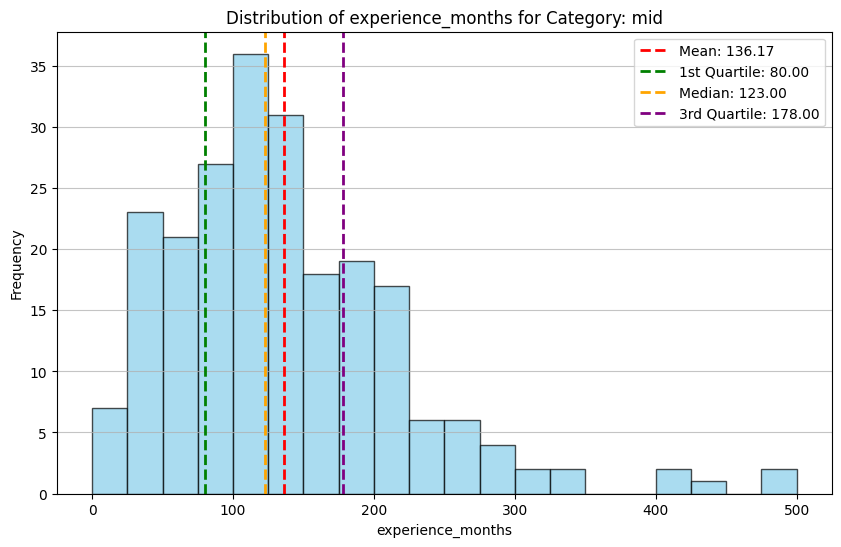

Category: mid
Mean Total Experience: 136.17 months
1st Quartile (25th percentile): 80.00 months
Median (50th percentile): 123.00 months
3rd Quartile (75th percentile): 178.00 months
--------------------------------------------------


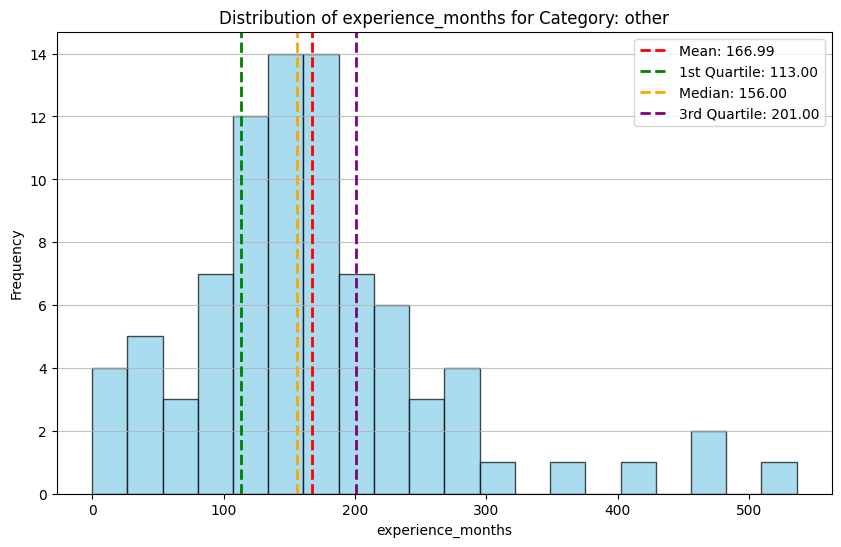

Category: other
Mean Total Experience: 166.99 months
1st Quartile (25th percentile): 113.00 months
Median (50th percentile): 156.00 months
3rd Quartile (75th percentile): 201.00 months
--------------------------------------------------


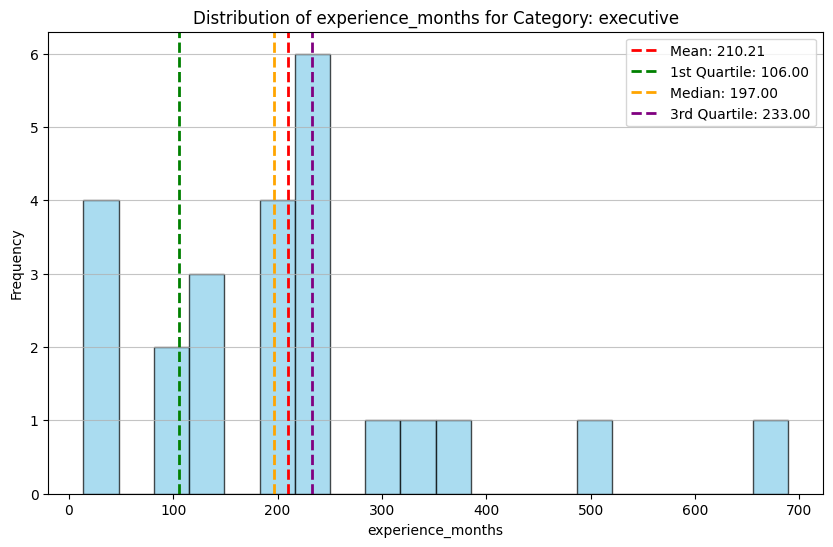

Category: executive
Mean Total Experience: 210.21 months
1st Quartile (25th percentile): 106.00 months
Median (50th percentile): 197.00 months
3rd Quartile (75th percentile): 233.00 months
--------------------------------------------------


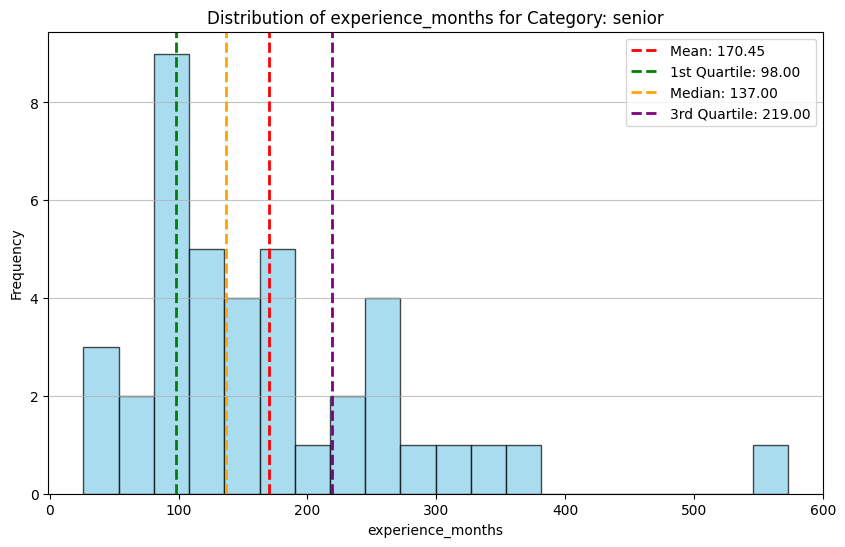

Category: senior
Mean Total Experience: 170.45 months
1st Quartile (25th percentile): 98.00 months
Median (50th percentile): 137.00 months
3rd Quartile (75th percentile): 219.00 months
--------------------------------------------------


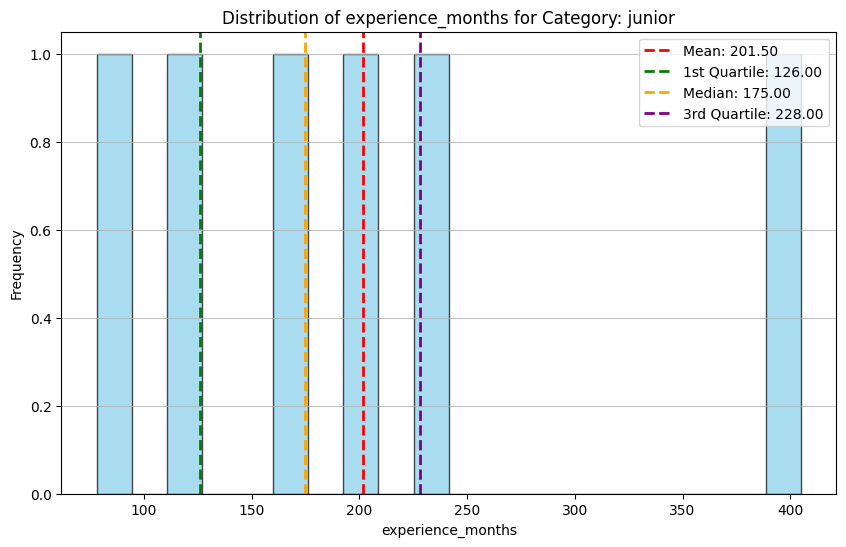

Category: junior
Mean Total Experience: 201.50 months
1st Quartile (25th percentile): 126.00 months
Median (50th percentile): 175.00 months
3rd Quartile (75th percentile): 228.00 months
--------------------------------------------------


In [0]:
import matplotlib.pyplot as plt
from pyspark.sql.functions import col, mean, expr

# --- Step 3: For each category, compute quartiles and plot the histogram ---
for category, df_cat in category_dfs_experience.items():
    # Optionally, filter by a threshold if needed (e.g., only consider rows with experience_months > 0)
    df_cat_filtered = df_cat.filter(col("experience_months") > -1)
    
    # Check if the filtered DataFrame for the current category is empty
    if df_cat_filtered.rdd.isEmpty():
        print(f"No experience data above threshold for category: {category}")
        continue

    # Compute statistical metrics using Spark on the filtered DataFrame
    stats = df_cat_filtered.select(
        mean(col("experience_months")).alias("mean_exp"),
        expr("percentile_approx(experience_months, 0.25)").alias("first_quartile"),
        expr("percentile_approx(experience_months, 0.5)").alias("median"),
        expr("percentile_approx(experience_months, 0.75)").alias("third_quartile")
    ).collect()[0]
    
    mean_exp = stats["mean_exp"]
    first_quartile = stats["first_quartile"]
    median = stats["median"]
    third_quartile = stats["third_quartile"]
    
    # Convert the filtered DataFrame to Pandas for plotting
    pdf = df_cat_filtered.select("experience_months").toPandas()
    
    # Plot the histogram
    plt.figure(figsize=(10, 6))
    n, bins, patches = plt.hist(pdf["experience_months"], bins=20, 
                                alpha=0.7, color='skyblue', edgecolor='black')
    
    # Add vertical lines for mean and quartiles
    plt.axvline(mean_exp, color='red', linestyle='dashed', linewidth=2, 
                label=f"Mean: {mean_exp:.2f}")
    plt.axvline(first_quartile, color='green', linestyle='dashed', linewidth=2, 
                label=f"1st Quartile: {first_quartile:.2f}")
    plt.axvline(median, color='orange', linestyle='dashed', linewidth=2, 
                label=f"Median: {median:.2f}")
    plt.axvline(third_quartile, color='purple', linestyle='dashed', linewidth=2, 
                label=f"3rd Quartile: {third_quartile:.2f}")
    
    # Customize the plot
    plt.title(f"Distribution of experience_months for Category: {category}")
    plt.xlabel("experience_months")
    plt.ylabel("Frequency")
    plt.grid(axis='y', alpha=0.75)
    plt.legend()
    
    # Display the plot
    plt.show()
    
    # Print the statistical metrics
    print(f"Category: {category}")
    print(f"Mean Total Experience: {mean_exp:.2f} months")
    print(f"1st Quartile (25th percentile): {first_quartile:.2f} months")
    print(f"Median (50th percentile): {median:.2f} months")
    print(f"3rd Quartile (75th percentile): {third_quartile:.2f} months")
    print("-" * 50)


### Feature 4 - Mentoring matching ###

In [0]:
%pip install selenium

from selenium.webdriver.common.by import By
from selenium.webdriver.chrome.options import Options
from selenium import webdriver
from bs4 import BeautifulSoup
import time
import pandas as pd

base_url = "https://intellizence.com/insights/layoff-downsizing/leading-companies-announcing-layoffs-and-hiring-freezes/"
# Set up headless Chrome
chrome_options = Options()
chrome_options.add_argument("--headless")
chrome_options.add_argument("--disable-gpu")
chrome_options.add_argument("--no-sandbox")

# Initialize the WebDriver
driver = webdriver.Chrome(options=chrome_options)

# Open the URL
driver.get(base_url)

layoffs_df = pd.DataFrame(columns=['Announcement date', 'Company', 'Industry', 'HQ', 'Number of Jobs'])

while True:
    # Get the page source and parse it with BeautifulSoup
    page_source = driver.page_source
    soup = BeautifulSoup(page_source, 'html.parser')

    # find the table with the class name
    table = soup.find('div', class_='dt-layout-row dt-layout-table')
    # find the table body
    tbody = table.find('tbody')

    # Process all table rows
    for row in tbody.find_all('tr'):
        cells = [cell.text.strip() for cell in row.find_all('td')]
        if len(cells) == 5:  # Make sure we have all 5 columns
            layoffs_df.loc[len(layoffs_df)] = cells

    # Find the Next button by class
    next_button = driver.find_element(By.CLASS_NAME, 'dt-paging-button.next')
    # Check if the next button is disabled
    if 'disabled' in next_button.get_attribute('class'):
        break

    # Click the Next button using JavaScript
    driver.execute_script("arguments[0].click();", next_button)
    time.sleep(0.5)  # Wait for page to load

# Close the WebDriver
driver.quit()

layoffs_df.head(20)

In [0]:
from pyspark.sql.functions import col, expr, size, explode, lag, when, count
from pyspark.sql.window import Window

# Explode the experience array to individual rows
exploded_profiles = profiles.withColumn("job", explode(col("experience")))

# Create a window specification to get the previous job
window_spec = Window.partitionBy("name").orderBy("job.start_date")

# Add a column for the previous job's company
exploded_profiles = exploded_profiles.withColumn("prev_company", lag(col("job.company")).over(window_spec))

# Identify back-to-back jobs with the same company
exploded_profiles = exploded_profiles.withColumn(
    "promotion",
    when(col("job.company") == col("prev_company"), True).otherwise(False)
)

# Filter to only include promotions
promotions = exploded_profiles.filter(col("promotion") == True)

display(promotions)

about avatar certifications city country_code current_company current_company:company_id current_company:name education educations_details experience followers following groups id languages name people_also_viewed position posts recommendations recommendations_count timestamp url volunteer_experience сourses job prev_company promotion null https://media.licdn.com/dms/image/C5603AQHG5GFgMR9Ifg/profile-displayphoto-shrink_800_800/0/1600462114478?e=2147483647&v=beta&t=VZ60A5rx5XnhE3NZ4q1LikjxR7wLvPP_jqve4k6Ivm0 List() East Lansing, Michigan, United States US List(michigan-state-university, Michigan State University, https://mx.linkedin.com/company/michigan-state-university?trk=public_profile_topcard-current-company, Michigan State University, Assistant Professor FT MSU Department of Biochemistry and Molecular Biology) michigan-state-university Michigan State University List(List(Doctor of Philosophy (Ph.D.), 2015, Biochemistry and Molecular Biology, 2010 - 2015 Studied the mechanisms of Chloroplast division by analyzing the function of the cytoskeletal protein FtsZ1 and FtsZ2, 2010, Michigan State University, https://mx.linkedin.com/school/michigan-state-university/?trk=public_profile_school_profile-section-card_image-click), List(Bachelor’s Degree, 2009, Biochemistry and Molecular Biology, 2005 - 2009, 2005, Michigan Technological University, null)) Michigan State University List(List(Michigan State University, michigan-state-university, null, 5 years 9 months, null, null, null, List(List(null, Dec 2020 - Present 2 years 10 months, 2 years 10 months, Present, Dec 2020 - Present2 years 10 months , East Lansing, Michigan, United States, Dec 2020, Michigan State University, Assistant Professor FT), List(null, Jan 2019 Dec 2020 2 years, 2 years, Dec 2020, Jan 2019 - Dec 20202 years, Jan 2019, Michigan State University, Fixed-Term Faculty), List(Taught Intro to Cells and Molecules laboratory class in the Biological Sciences program (BioSci171), Jan 2018 Dec 2018 1 year, 1 year, Dec 2018, Jan 2018 - Dec 20181 year , Taught Intro to Cells and Molecules laboratory class in the Biological Sciences program (BioSci171), Jan 2018, Michigan State University, Fiexed-Term Instructor)), null, null, null, null, https://mx.linkedin.com/company/michigan-state-university?trk=public_profile_experience-group-header), List(Michigan State University, michigan-state-university, null, 7 years 9 months, null, null, null, List(List(null, Jan 2016 Apr 2017 1 year 4 months, 1 year 4 months, Apr 2017, Jan 2016 - Apr 20171 year 4 months, Jan 2016, Michigan State University, Postdoctoral Research Associate), List(Our lab studies the mechanisms of chloroplast division in the model plant Arabidopsis thaliana. More specifically, I focus on studying the functional relationship between the functionally distinct FtsZ1 and FtsZ2 proteins that assemble into the mid-plastid FtsZ ring., Aug 2009 Dec 2015 6 years 5 months, 6 years 5 months, Dec 2015, Aug 2009 - Dec 20156 years 5 months , Our lab studies the mechanisms of chloroplast division in the model plant Arabidopsis thaliana. More specifically, I focus on studying the functional relationship between the functionally distinct FtsZ1 and FtsZ2 proteins that assemble into the mid-plastid FtsZ ring., Aug 2009, Michigan State University, Graduate Research Assistent)), null, null, null, null, https://mx.linkedin.com/company/michigan-state-university?trk=public_profile_experience-group-header)) 207 207 List() allan-terbush-8054817a List() Allan TerBush List(List(https://www.linkedin.com/in/abby-carvey-887172a5?trk=public_profile_browsemap), List(https://www.linkedin.com/in/mimmi-shawn-fitzgerald-8752a564?trk=public_profile_browsemap), List(https://www.linkedin.com/in/brenda-stoffel-b685a21a1?trk=public_profile_browsemap), List(https://www.linkedin.com/in/kyle-meenagh-094060135?trk=public_profile_browsemap), List(https://www.linkedin.com/in/barrett-busick-787780141?trk=public_profile_browsemap), List(https://www.linkedin.com

In [0]:
from pyspark.sql.functions import col, collect_list
from pyspark.sql.window import Window

# Filter promotions to include only specified companies
filtered_promotions = promotions.filter(col("job.company").isin("Meta", "Amazon", "Microsoft"))

# Group by company and collect lists of people who got promoted
promotions_by_company = filtered_promotions.groupBy("job.company").agg(collect_list("id").alias("promoted_people"))

display(promotions_by_company)

company,promoted_people
Meta,"List(allison-anthonisz-thornton, marina-stam)"
Microsoft,"List(erezkikingil, jeffreyrobinsonseattle, rcrayii-a565a44, vickifunk, matthew-halpert-911b6a91, sikchi, andremagni, bethstrack, jrunning, jennifer-molloy, sravanikothapalle, annika-elias, anupreghunathan, hillaryfholmer, megandohnal, john-dubois-88b61, jhenshaw, michael-jonas, shanthini-thyagarajan-6b4aba37, khandelwalvaishali, lisa-saulter-aa5a8b39, lesliecchen, ramesh-kumar-54037836, adocmoore, david-priestley-2a48429, hernan-tabares, logan-miller-3618699b, lixin-xu-867759a, adamhineline, adam-howe-6102b84, phillip-carver-3974b712, richard-tkachuk-9065272a, annemgardiner, oliversharp, subhagoak, cjcorbett, nancytandy, karen-nelson-107883a1, ivelisematavelli, rob-shradar-1a29683, patrick-haley-428ba62b, klimovanton, aaronschnieder, ccrh, harold-henry-83956023)"
Amazon,"List(jane-watson-4778aabb, michael-pimentel-35126543, marla-price-foerster-45095589, tony-bode-46471829, troy-j-ballard-9a639420, annabonnett, narasimha-g-01560117, avdugan, natalialim, robert-coon-299b213, kristine-lorah-6456a186, aaronrosenstein, brent-williams-9ba2a3124, koyotakahashi, clifford-staggs-7a6520103)"


In [0]:
from pyspark.sql import functions as F

# Step 1: Explode the promoted_people array into individual rows.
# This creates a new column 'employee_id' where each row contains a single user id.
promotions_exploded_df = promotions_by_company.withColumn("employee_id", F.explode("promoted_people"))

# Step 2: Perform a left join with the profiles_df on the employee id.
# This will add the profile details (e.g., name, url) for each employee.
joined_promotions_users_df = promotions_exploded_df.join(
    profiles,
    promotions_exploded_df.employee_id == profiles.id,
    how="left"
)

# Step 3: Select the desired columns. For example, if you need:
#         - employee id (renamed to 'id'),
#         - company,
#         - element,
#         - url.
recommended_mentors_df = joined_promotions_users_df.select(
    F.col("employee_id").alias("id"),
    "company",
    "name",
    "url"
)

# Optional: Show the resulting DataFrame
display(recommended_mentors_df)

id,company,name,url
aaronschnieder,Microsoft,Aaron Schnieder,https://www.linkedin.com/in/aaronschnieder
andremagni,Microsoft,André Magni,https://www.linkedin.com/in/andremagni/
erezkikingil,Microsoft,Erez Kikin-Gil,https://www.linkedin.com/in/erezkikingil
harold-henry-83956023,Microsoft,Harold Henry,https://www.linkedin.com/in/harold-henry-83956023
lixin-xu-867759a,Microsoft,LiXin Xu,https://www.linkedin.com/in/lixin-xu-867759a
matthew-halpert-911b6a91,Microsoft,Matthew Halpert,https://www.linkedin.com/in/matthew-halpert-911b6a91
allison-anthonisz-thornton-37416926,Meta,Allison Anthonisz Thornton,https://www.linkedin.com/in/allison-anthonisz-thornton-37416926
brent-williams-9ba2a3124,Amazon,Brent Williams,https://www.linkedin.com/in/brent-williams-9ba2a3124
jhenshaw,Microsoft,Jeff Henshaw,https://www.linkedin.com/in/jhenshaw
kristine-lorah-6456a186,Amazon,Kristine Lorah,https://www.linkedin.com/in/kristine-lorah-6456a186


### Outputs ###

In [0]:
# Extract the top 3 most counted courses
top_courses = sorted(merged_courses, key=lambda x: x['count'], reverse=True)[:3]

# Extract the top 3 most counted certifications
top_certifications = sorted(merged_certifications, key=lambda x: x['count'], reverse=True)[:3]

# Generate a suggestion message
print(f"For your position, **{position_1}**, the most relevant courses are:")
for i, course in enumerate(top_courses, start=1):
    print(f"{i}. {course['title']}")

print("\nYou should also have a certification in:")
for i, cert in enumerate(top_certifications, start=1):
    print(f"{i}. {cert['title']}")


---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-8881827304333257>, line 4
      1 import matplotlib.pyplot as plt
      3 # Convert filtered_courses_certifications to Pandas for visualization
----> 4 filtered_courses_certifications_df = filtered_courses_certifications.toPandas()
      6 # Plot a bar chart
      7 plt.figure(figsize=(10, 6))

NameError: name 'filtered_courses_certifications' is not defined

In [0]:
import spacy
from collections import Counter
from spacy.lang.en.stop_words import STOP_WORDS

# Load the spaCy model (use a larger model if desired)
nlp = spacy.load("en_core_web_sm")

# --- Your existing functions for merging titles ---

def get_common_prefix_suffix(titles):
    if not titles:
        return "", ""
    split_titles = [title.split() for title in titles]
    # Find common prefix
    prefix = []
    for words in zip(*split_titles):
        if all(word == words[0] for word in words):
            prefix.append(words[0])
        else:
            break
    # Find common suffix
    suffix = []
    # Reverse each title before splitting into words for suffix computation
    reversed_splits = [title.split()[::-1] for title in titles]
    for words in zip(*reversed_splits):
        if all(word == words[0] for word in words):
            suffix.append(words[0])
        else:
            break
    suffix = suffix[::-1]  # Reverse back the suffix to proper order
    return " ".join(prefix), " ".join(suffix)

def create_meaningful_merged_title(titles):
    if len(titles) == 1:
        return titles[0]
    prefix, suffix = get_common_prefix_suffix(titles)
    # Extract unique middle parts
    middle_parts = []
    for title in titles:
        stripped_title = title
        if prefix:
            stripped_title = stripped_title[len(prefix):].strip()
        if suffix and stripped_title.endswith(suffix):
            stripped_title = stripped_title[: -len(suffix)].strip()
        middle_parts.append(stripped_title)
    unique_middle_parts = sorted(set(middle_parts))
    # Combine prefix, unique middle parts, and suffix
    merged_title = f"{prefix} {' / '.join(unique_middle_parts)} {suffix}".strip()
    return merged_title

def group_similar_titles_with_meaningful_merging(df, similarity_threshold=0.75):
    """
    Groups titles if their semantic similarity (based on spaCy vectors)
    is above the specified similarity_threshold (0 to 1).
    """
    titles = df.select("title", "count").collect()
    grouped = []

    for row in titles:
        title = row["title"]
        count = int(row["count"])  # Ensure count is an integer
        doc_title = nlp(title.lower())
        found_group = False

        for group in grouped:
            doc_group = nlp(group["title"].lower())
            similarity = doc_title.similarity(doc_group)
            
            if similarity > similarity_threshold:
                # Merge into existing group
                group["count"] += count
                group["merged_titles"].append(title)
                group["title"] = create_meaningful_merged_title(group["merged_titles"])
                found_group = True
                break

        if not found_group:
            grouped.append({
                "title": title,
                "count": count,
                "merged_titles": [title]
            })

    return grouped

# --- New function to create a general (short) name for a group ---

def get_general_name(titles):
    """
    Given a list of certification titles, generate a short summary label
    by taking the most frequent meaningful words.
    """
    # Concatenate all titles and process with spaCy
    combined_text = " ".join(titles)
    doc = nlp(combined_text)
    
    # Filter tokens: keep only alphabetic tokens that are not stop words,
    # and that are either proper nouns or common nouns.
    tokens = [
        token.text for token in doc 
        if token.is_alpha 
        and token.text.lower() not in STOP_WORDS 
        and token.pos_ in ["NOUN", "PROPN"]
    ]
    
    if not tokens:
        return "General Courses"
    
    # Count frequencies
    freq = Counter(tokens)
    # Get the top 3 most common words (adjust number as needed)
    common_words = [word for word, count in freq.most_common(3)]
    # Return a short summary label (join with a space or "/")
    return " ".join(common_words)

# --- Now, use field_1 to get the specific DataFrame and print suggestions ---
from pyspark.sql.functions import col

# Check if field_1 exists in our dictionary of DataFrames
if field_1 not in category_dfs_courses:
    print(f"Field '{field_1}' not found in the dataset.")
else:
    df_field = category_dfs_courses[field_1]
    
    # Order by count descending and get the top 3 rows
    top3_df = df_field.orderBy(col("count").desc()).limit(3)
    top3_rows = top3_df.collect()
    
    if not top3_rows:
        print(f"No certification data available for field '{field_1}'.")
    else:
        print(f"For your field, {field_1}, the 3 most common courses among employees in your field in the company are:")
        for row in top3_rows:
            # The column 'merged_titles' is a string of all titles in that group separated by commas.
            # We split them and generate a short general name.
            titles_list = row['merged_titles'].split(", ")
            general_name = get_general_name(titles_list)
            print(f"- {general_name} (appears {row['count']} times)")


---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-8881827304333257>, line 4
      1 import matplotlib.pyplot as plt
      3 # Convert filtered_courses_certifications to Pandas for visualization
----> 4 filtered_courses_certifications_df = filtered_courses_certifications.toPandas()
      6 # Plot a bar chart
      7 plt.figure(figsize=(10, 6))

NameError: name 'filtered_courses_certifications' is not defined

In [0]:
import spacy
from collections import Counter
from spacy.lang.en.stop_words import STOP_WORDS

# Load the spaCy model (use a larger model if desired)
nlp = spacy.load("en_core_web_sm")

# --- Your existing functions for merging titles ---

def get_common_prefix_suffix(titles):
    if not titles:
        return "", ""
    split_titles = [title.split() for title in titles]
    # Find common prefix
    prefix = []
    for words in zip(*split_titles):
        if all(word == words[0] for word in words):
            prefix.append(words[0])
        else:
            break
    # Find common suffix
    suffix = []
    # Reverse each title before splitting into words for suffix computation
    reversed_splits = [title.split()[::-1] for title in titles]
    for words in zip(*reversed_splits):
        if all(word == words[0] for word in words):
            suffix.append(words[0])
        else:
            break
    suffix = suffix[::-1]  # Reverse back the suffix to proper order
    return " ".join(prefix), " ".join(suffix)

def create_meaningful_merged_title(titles):
    if len(titles) == 1:
        return titles[0]
    prefix, suffix = get_common_prefix_suffix(titles)
    # Extract unique middle parts
    middle_parts = []
    for title in titles:
        stripped_title = title
        if prefix:
            stripped_title = stripped_title[len(prefix):].strip()
        if suffix and stripped_title.endswith(suffix):
            stripped_title = stripped_title[: -len(suffix)].strip()
        middle_parts.append(stripped_title)
    unique_middle_parts = sorted(set(middle_parts))
    # Combine prefix, unique middle parts, and suffix
    merged_title = f"{prefix} {' / '.join(unique_middle_parts)} {suffix}".strip()
    return merged_title

def group_similar_titles_with_meaningful_merging(df, similarity_threshold=0.75):
    """
    Groups titles if their semantic similarity (based on spaCy vectors)
    is above the specified similarity_threshold (0 to 1).
    """
    titles = df.select("title", "count").collect()
    grouped = []

    for row in titles:
        title = row["title"]
        count = int(row["count"])  # Ensure count is an integer
        doc_title = nlp(title.lower())
        found_group = False

        for group in grouped:
            doc_group = nlp(group["title"].lower())
            similarity = doc_title.similarity(doc_group)
            
            if similarity > similarity_threshold:
                # Merge into existing group
                group["count"] += count
                group["merged_titles"].append(title)
                group["title"] = create_meaningful_merged_title(group["merged_titles"])
                found_group = True
                break

        if not found_group:
            grouped.append({
                "title": title,
                "count": count,
                "merged_titles": [title]
            })

    return grouped

# --- New function to create a general (short) name for a group ---

def get_general_name(titles):
    """
    Given a list of certification titles, generate a short summary label
    by taking the most frequent meaningful words.
    """
    # Concatenate all titles and process with spaCy
    combined_text = " ".join(titles)
    doc = nlp(combined_text)
    
    # Filter tokens: keep only alphabetic tokens that are not stop words,
    # and that are either proper nouns or common nouns.
    tokens = [
        token.text for token in doc 
        if token.is_alpha 
        and token.text.lower() not in STOP_WORDS 
        and token.pos_ in ["NOUN", "PROPN"]
    ]
    
    if not tokens:
        return "General Certifications"
    
    # Count frequencies
    freq = Counter(tokens)
    # Get the top 3 most common words (adjust number as needed)
    common_words = [word for word, count in freq.most_common(3)]
    # Return a short summary label (join with a space or "/")
    return " ".join(common_words)

# --- Now, use field_1 to get the specific DataFrame and print suggestions ---
from pyspark.sql.functions import col

# Check if field_1 exists in our dictionary of DataFrames
if field_1 not in category_dfs_certifications:
    print(f"Field '{field_1}' not found in the dataset.")
else:
    df_field = category_dfs_certifications[field_1]
    
    # Order by count descending and get the top 3 rows
    top3_df = df_field.orderBy(col("count").desc()).limit(3)
    top3_rows = top3_df.collect()
    
    if not top3_rows:
        print(f"No certification data available for field '{field_1}'.")
    else:
        print(f"For your field, {field_1}, the 3 most common certifications among employees in your field in the company are:")
        for row in top3_rows:
            # The column 'merged_titles' is a string of all titles in that group separated by commas.
            # We split them and generate a short general name.
            titles_list = row['merged_titles'].split(", ")
            general_name = get_general_name(titles_list)
            print(f"- {general_name} (appears {row['count']} times)")


---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-8881827304333257>, line 4
      1 import matplotlib.pyplot as plt
      3 # Convert filtered_courses_certifications to Pandas for visualization
----> 4 filtered_courses_certifications_df = filtered_courses_certifications.toPandas()
      6 # Plot a bar chart
      7 plt.figure(figsize=(10, 6))

NameError: name 'filtered_courses_certifications' is not defined

In [0]:
similar_people_indexes_list_for_emp = result_similar_titles_df.filter(col("id") == employee_id).select("similar_titles").rdd.flatMap(lambda x: x).collect()
# Filter the DataFrame with the similar indexes
filtered_result_df = result_similar_titles_df.filter(col("index").isin(*similar_people_indexes_list_for_emp))

# join profiles_df to filtered_result_df on 'id'
employee_profile_links_df = filtered_result_df.join(profiles, on="id", how="inner")
employee_profile_links_df = employee_profile_links_df.select("id", "name", "avatar", "url")
display(employee_profile_links_df)

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-8881827304333257>, line 4
      1 import matplotlib.pyplot as plt
      3 # Convert filtered_courses_certifications to Pandas for visualization
----> 4 filtered_courses_certifications_df = filtered_courses_certifications.toPandas()
      6 # Plot a bar chart
      7 plt.figure(figsize=(10, 6))

NameError: name 'filtered_courses_certifications' is not defined

In [0]:
from pyspark.sql.functions import col, lower, mean, expr
# (Assuming other required imports, e.g. spark session, are already done)

###########################################
# 1. EDUCATION SCORE – Determine quartile
###########################################
edu_score_component = None  # will be 0,1,2,3 based on quartile

if rank_1 not in category_dfs_edu_score:
    print(f"Category '{rank_1}' not found in the education dataset.")
else:
    df_edu = category_dfs_edu_score[rank_1].filter(col("education_score") > 10)
    if df_edu.rdd.isEmpty():
        print(f"No education scores above threshold for category: {rank_1}")
    else:
        stats = df_edu.select(
            mean(col("education_score")).alias("mean_score"),
            expr("percentile_approx(education_score, 0.25)").alias("first_quartile"),
            expr("percentile_approx(education_score, 0.5)").alias("median"),
            expr("percentile_approx(education_score, 0.75)").alias("third_quartile")
        ).collect()[0]

        first_quartile_edu = stats["first_quartile"]
        median_edu = stats["median"]
        third_quartile_edu = stats["third_quartile"]

        # Determine which quartile edu_score_1 falls into and assign a numeric component:
        if edu_score_1 <= first_quartile_edu:
            edu_quartile_str = "1st Quartile (0-25%)"
            edu_score_component = 0
        elif edu_score_1 <= median_edu:
            edu_quartile_str = "2nd Quartile (25-50%)"
            edu_score_component = 1
        elif edu_score_1 <= third_quartile_edu:
            edu_quartile_str = "3rd Quartile (50-75%)"
            edu_score_component = 2
        else:
            edu_quartile_str = "4th Quartile (75-100%)"
            edu_score_component = 3

###########################################
# 2. EXPERIENCE – Determine quartile
###########################################
exp_score_component = None  # will be 0,1,2,3

if rank_1 not in category_dfs_experience:
    print(f"Category '{rank_1}' not found in the experience dataset.")
else:
    df_exp = category_dfs_experience[rank_1].filter(col("experience_months") > -1)
    if df_exp.rdd.isEmpty():
        print(f"No experience scores above threshold for category: {rank_1}")
    else:
        stats = df_exp.select(
            mean(col("experience_months")).alias("mean_experience"),
            expr("percentile_approx(experience_months, 0.25)").alias("first_quartile"),
            expr("percentile_approx(experience_months, 0.5)").alias("median"),
            expr("percentile_approx(experience_months, 0.75)").alias("third_quartile")
        ).collect()[0]

        first_quartile_exp = stats["first_quartile"]
        median_exp = stats["median"]
        third_quartile_exp = stats["third_quartile"]

        if experience_1 <= first_quartile_exp:
            exp_quartile_str = "1st Quartile (0-25%)"
            exp_score_component = 0
        elif experience_1 <= median_exp:
            exp_quartile_str = "2nd Quartile (25-50%)"
            exp_score_component = 1
        elif experience_1 <= third_quartile_exp:
            exp_quartile_str = "3rd Quartile (50-75%)"
            exp_score_component = 2
        else:
            exp_quartile_str = "4th Quartile (75-100%)"
            exp_score_component = 3

###########################################
# 3. DEGREE & FIELD MATCH
###########################################
# Create a search string that is expected to appear in final_df.merged_title.
search_string = f"{degree_level_1.lower()} in {degree_type_1.lower()}"

# Ensure field_1 and rank_1 are compared in lower-case
df_degree = final_df.filter(
    (lower(col("field_category")) == field_1.lower()) & 
    (lower(col("rank_category")) == rank_1.lower())
)
df_combination = df_degree.filter(lower(col("merged_title")).like(f"%{search_string}%"))

# If the combination appears, award 1 point; else 0.
degree_match_component = 1 if not df_combination.rdd.isEmpty() else 0

###########################################
# 4. ADVANCED DEGREE BONUS
###########################################
# If the employee has a master's or PhD, add 1 bonus point.
advanced_degree_component = 1 if degree_level_1.lower() in ["masters", "phd"] else 0

###########################################
# 5. PROMOTION SCORE & CHANCE TO PROMOTE
###########################################
# Total score (maximum possible = 3 (edu) + 3 (exp) + 1 (degree match) + 1 (advanced) = 8)
total_score = edu_score_component + exp_score_component + degree_match_component + advanced_degree_component

if total_score in [0, 1, 2]:
    promotion_chance = "low"
elif total_score in [3, 4, 5]:
    promotion_chance = "medium"
elif total_score in [6, 7, 8]:
    promotion_chance = "high"
else:
    promotion_chance = "undefined"  # should not happen

###########################################
# 6. SUGGESTIONS BASED ON SCORES
###########################################
suggestions = []
if edu_score_component == 0:
    suggestions.append("Consider improving your educational qualifications (e.g., pursue further studies or certifications).")
if exp_score_component == 0:
    suggestions.append("Gain more hands-on experience in your field.")
if degree_match_component == 0:
    suggestions.append("Review if additional or more relevant certifications could benefit your career.")
if advanced_degree_component == 0 and degree_level_1.lower() == "bachelor":
    suggestions.append("Pursuing an advanced degree (Master's or PhD) might boost your promotion prospects.")

# Combine suggestions into a single string.
suggestions_text = " ".join(suggestions) if suggestions else "Keep up the great work!"

###########################################
# 8. FINAL OUTPUT MESSAGE
###########################################
print("========================================")
print("Promotion Assessment:")
print(f"Category: {rank_1}")
print(f"Education Score: {edu_score_1} ({edu_quartile_str})  -->  Score component: {edu_score_component}")
print(f"Experience: {experience_1} months ({exp_quartile_str})  -->  Score component: {exp_score_component}")
print(f"Degree & Field Match: {'Yes' if degree_match_component==1 else 'No'}  -->  Score component: {degree_match_component}")
print(f"Advanced Degree Bonus: {'Yes' if advanced_degree_component==1 else 'No'}  -->  Score component: {advanced_degree_component}")
print("----------------------------------------")
print(f"Total Promotion Score: {total_score} out of 8")
print(f"Your chance to promote is: {promotion_chance.upper()}")
print("Suggestions:")
print(suggestions_text)
print("========================================")


---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-8881827304333257>, line 4
      1 import matplotlib.pyplot as plt
      3 # Convert filtered_courses_certifications to Pandas for visualization
----> 4 filtered_courses_certifications_df = filtered_courses_certifications.toPandas()
      6 # Plot a bar chart
      7 plt.figure(figsize=(10, 6))

NameError: name 'filtered_courses_certifications' is not defined

In [0]:
from pyspark.sql.functions import col
from pyspark.sql.window import Window
import pyspark.sql.functions as F

# Add a row number to each row partitioned by company and ordered randomly
window_spec = Window.partitionBy("company").orderBy(F.rand())
recommended_mentors_df = recommended_mentors_df.withColumn("row_num", F.row_number().over(window_spec))

# Filter to keep only the first 3 rows for each company
recommended_mentors_df = recommended_mentors_df.filter(col("row_num") <= 3).drop("row_num")

display(recommended_mentors_df)

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-8881827304333257>, line 4
      1 import matplotlib.pyplot as plt
      3 # Convert filtered_courses_certifications to Pandas for visualization
----> 4 filtered_courses_certifications_df = filtered_courses_certifications.toPandas()
      6 # Plot a bar chart
      7 plt.figure(figsize=(10, 6))

NameError: name 'filtered_courses_certifications' is not defined